# Objectif 

Première analyse des données ACOUPLANE. On considère les deux enregistrements simultannés de l'OBS 4 et de l'OBS 7 : 

* OBS 4 : Audio_3_2026_02_24-19_56_47.wav
* OBS 7 : Audio_3_2026_02_24-16_26_45.wav

In [1]:
import os
import sys
import numpy as np
import xarray as xr 
import pandas as pd
import soundfile as sf
import scipy.signal as sp
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates

from datetime import datetime, timedelta

project_root = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd"
sys.path.append(
    project_root
)  # \real_data_analysis\fiberscope_groix\src\data_processing
root_data = (
    r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\acouplane\data"
)
root_bathy_data = os.path.join(project_root, "data", "bathy")
from publication.publication_figure import PubFigure, set_subfigures_abc_labels
PubFigure()

In [2]:
# Read files
wav_root = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\data\ACOUPLANE"
folder_obs4 = os.path.join(wav_root, "OBS4")
folder_obs7 = os.path.join(wav_root, "OBS7")
folder_obsa = os.path.join(wav_root, "OBSa")
folder_obsb = os.path.join(wav_root, "OBSb")
folder_obsc = os.path.join(wav_root, "OBSc")
folder_obsd = os.path.join(wav_root, "OBSd")


# Datetime format
date_fmt = "%Y_%m_%d-%H_%M_%S"
save_date_fmt = "%Y-%m-%d_%H-%M-%S"
# Files info
fname1 = "Audio_3_2026_02_24-19_56_47.wav"
date1 = "2026_02_24-19_56_47"
fname2 = "Audio_3_2026_02_24-16_26_45.wav"
date2 = "2026_02_24-16_26_45"
# OBS a
fname3 = "Audio_3_2026_02_24-19_41_41.wav"
date3 = "2026_02_24-19_41_41"
# OBS b
fname4 = "Audio_3_2026_02_24-16_30_00.wav"
date4 = "2026_02_24-16_30_00"
# OBS c
fname5 = "Audio_3_2026_02_24-16_00_00.wav"
date5 = "2026_02_24-16_00_00"
# OBS d
fname6 = "Audio_3_2026_02_24-20_36_42.wav"
date6 = "2026_02_24-20_36_42"

# Datetime
start_dt1 = datetime.strptime(date1, date_fmt)
start_dt2 = datetime.strptime(date2, date_fmt)
start_dt3 = datetime.strptime(date3, date_fmt)
start_dt4 = datetime.strptime(date4, date_fmt)
start_dt5 = datetime.strptime(date5, date_fmt)
start_dt6 = datetime.strptime(date6, date_fmt)

# Build fpath
wav_files = [fname1, fname2]
fpath1 = os.path.join(folder_obs4, fname1)
fpath2 = os.path.join(folder_obs7, fname2)
fpath3 = os.path.join(folder_obsa, fname3)
fpath4 = os.path.join(folder_obsb, fname4)
fpath5 = os.path.join(folder_obsc, fname5)
fpath6 = os.path.join(folder_obsd, fname6)

In [3]:
def load_signal(fpath, center=True):
    # Load signal from wav file
    signal, fs = sf.read(fpath)
    ns = signal.size
    # Get time vector
    time = np.arange(signal.shape[0]) / fs
    if center:
        # Centre signal
        signal -= np.mean(signal)

    return time, signal, fs, ns

In [4]:
# Load signal from wav file
time1, signal1, fs1, ns1 = load_signal(fpath=fpath1, center=True)
time2, signal2, fs2, ns2 = load_signal(fpath=fpath2, center=True)
time3, signal3, fs3, ns3 = load_signal(fpath=fpath3, center=True)
time4, signal4, fs4, ns4 = load_signal(fpath=fpath4, center=True)
time5, signal5, fs5, ns5 = load_signal(fpath=fpath5, center=True)
time6, signal6, fs6, ns6 = load_signal(fpath=fpath6, center=True)

MemoryError: Unable to allocate 382. MiB for an array with shape (50004000,) and data type float64

In [ ]:
# Compute end datetime
end_dt1 = start_dt1 + pd.Timedelta(ns1 / fs1, "s")
end_dt2 = start_dt2 + pd.Timedelta(ns2 / fs2, "s")
end_dt3 = start_dt3 + pd.Timedelta(ns3 / fs3, "s")
end_dt4 = start_dt4 + pd.Timedelta(ns4 / fs4, "s")
end_dt5 = start_dt5 + pd.Timedelta(ns5 / fs5, "s")
end_dt6 = start_dt6 + pd.Timedelta(ns6 / fs6, "s")

end_dts = [end_dt1, end_dt2, end_dt3, end_dt4, end_dt5, end_dt6]
start_dts = [start_dt1, start_dt2, start_dt3, start_dt4, start_dt5, start_dt6]

for i in range(len(start_dts)):
    print(f"Start datetime : {start_dts[i]}")
    print(f"End datetime : {end_dts[i]}")

# print(
#     f"Start datetimes : \n\t Start datetime 1 : {start_dt1} \n\t Start datetime 2 : {start_dt2}"
# )
# print(
#     f"End datetimes : \n\t End datetime 1 : {end_dt1} \n\t End datetime 2 : {end_dt2}"
# )

Start datetime : 2026-02-24 19:56:47
End datetime : 2026-02-25 02:53:37.750000
Start datetime : 2026-02-24 16:26:45
End datetime : 2026-02-24 23:23:27.125000
Start datetime : 2026-02-24 19:41:41
End datetime : 2026-02-25 02:38:27.125000
Start datetime : 2026-02-24 16:30:00
End datetime : 2026-02-24 23:26:40.375000
Start datetime : 2026-02-24 16:00:00
End datetime : 2026-02-24 22:56:47.375000
Start datetime : 2026-02-24 20:36:42
End datetime : 2026-02-25 03:33:24


In [ ]:
# Storing time is useless since we can easily recompute it from fs
ds_wav = xr.Dataset(
    data_vars=dict(
        signal_obs4=(
            ["time4"],
            signal1.astype(np.float32),
        ),
        signal_obs7=(
            ["time7"],
            signal1.astype(np.float32),
        ),
        signal_obsa=(
            ["timea"],
            signal3.astype(np.float32),
        ),
        signal_obsb=(
            ["timeb"],
            signal4.astype(np.float32),
        ),
        signal_obsc=(
            ["timec"],
            signal5.astype(np.float32),
        ),
        signal_obsd=(
            ["timed"],
            signal6.astype(np.float32),
        ),
        rcv_name=(
            ["obs_id"],
            ["OBS4", "OBS7", "OBSa", "OBSb", "OBSc", "OBSd"],
        ),
        fs=(
            ["obs_id"],
            [fs1, fs2, fs3, fs4, fs5, fs6],
        ),
    ),
    coords=dict(
        obs_id=[4, 7, 1, 2, 5, 6]       # TODO check this with Bazile 
    ),
    attrs=dict(
        description="Merged wav files from ACOUPLANE data sample.",
        channel="H",
        start_datetime_obs4=start_dt1.strftime(save_date_fmt),
        end_datetime_obs4=end_dt1.strftime(save_date_fmt),
        start_datetime_obs7=start_dt2.strftime(save_date_fmt),
        end_datetime_obs7=end_dt2.strftime(save_date_fmt),
        start_datetime_obsa=start_dt3.strftime(save_date_fmt),
        end_datetime_obsa=end_dt3.strftime(save_date_fmt),
        start_datetime_obsb=start_dt4.strftime(save_date_fmt),
        end_datetime_obsb=end_dt4.strftime(save_date_fmt),
        start_datetime_obsc=start_dt5.strftime(save_date_fmt),
        end_datetime_obsc=end_dt5.strftime(save_date_fmt),
        start_datetime_obsd=start_dt6.strftime(save_date_fmt),
        end_datetime_obsd=end_dt6.strftime(save_date_fmt),
        datetime_format=save_date_fmt,
    ),
)

# Save dataset
fname = f"acouplane_sample_wav.nc"
nc_fpath = os.path.join(root_data, fname)
ds_wav.to_netcdf(nc_fpath)

print(f"NetCDF file saved at: {nc_fpath}")

NetCDF file saved at: C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\acouplane\data\acouplane_sample_wav.nc


In [ ]:
ds_wav

<xarray.Dataset> Size: 1GB
Dimensions:      (time4: 50021500, time7: 50021500, timea: 50012250,
                  timeb: 50000750, timec: 50014750, timed: 50004000, obs_id: 6)
Coordinates:
  * obs_id       (obs_id) int32 24B 4 7 1 2 5 6
Dimensions without coordinates: time4, time7, timea, timeb, timec, timed
Data variables:
    signal_obs4  (time4) float32 200MB -0.000168 -0.0003927 ... 0.000575
    signal_obs7  (time7) float32 200MB -0.000168 -0.0003927 ... 0.000575
    signal_obsa  (timea) float32 200MB -0.00232 -0.003367 ... -0.02141 -0.01919
    signal_obsb  (timeb) float32 200MB -0.003268 0.002509 ... 0.0002771 0.00201
    signal_obsc  (timec) float32 200MB 0.0001806 -0.000451 ... -0.003153
    signal_obsd  (timed) float32 200MB -0.0008542 -0.001505 ... 0.003199
    rcv_name     (obs_id) <U4 96B 'OBS4' 'OBS7' 'OBSa' 'OBSb' 'OBSc' 'OBSd'
    fs           (obs_id) int32 24B 2000 2000 2000 2000 2000 2000
Attributes: (12/15)
    description:          Merged wav files from ACOUPLANE data sample.
    channel:              H
    start_datetime_obs4:  2026-02-24_19-56-47
    end_datetime_obs4:    2026-02-25_02-53-37
    start_datetime_obs7:  2026-02-24_16-26-45
    end_datetime_obs7:    2026-02-24_23-23-27
    ...                   ...
    end_datetime_obsb:    2026-02-24_23-26-40
    start_datetime_obsc:  2026-02-24_16-00-00
    end_datetime_obsc:    2026-02-24_22-56-47
    start_datetime_obsd:  2026-02-24_20-36-42
    end_datetime_obsd:    2026-02-25_03-33-24
    datetime_format:      %Y-%m-%d_%H-%M-%S

# Analyse de 30 secondes de signal 

In [ ]:
dict_corresp_before_verif = {
    4: "4",
    7: "7",
    1: "a",
    2: "b",
    5: "c",
    6: "d",
}

def plot_sequence(ds_wav, start_analysis_dt, analysis_duration_s, nperseg=2**8, alpha_overlap=0.75):

    datetime_fmt = ds_wav.attrs["datetime_format"]

    # Analysis bounds
    t_start = datetime.strptime(start_analysis_dt, datetime_fmt)
    t_end = t_start + timedelta(seconds=analysis_duration_s)

    # Signal
    plot_signal(ds_wav, t_start, t_end)

    # Spectrogram
    noverlap = int(nperseg * alpha_overlap)
    plot_spectro(ds_wav, t_start, t_end, nperseg, noverlap)


def plot_spectro(ds_wav, t_start, t_end, nperseg, noverlap):
    
    n_obs = ds_wav.sizes["obs_id"]
    fig, axs = plt.subplots(n_obs, 1, sharex=True, figsize=(16, 12))
    axs = np.atleast_1d(axs)

    sxx_plot = []

    for i, id_ in enumerate(ds_wav.obs_id.values):

        obs_id = dict_corresp_before_verif[id_]     # UPDATE TODO after verif 

        datetime_fmt = ds_wav.attrs["datetime_format"]

        sig_varname = f"signal_obs{obs_id}"
        time_coordsname = f"time{obs_id}"
        signal = ds_wav[sig_varname]

        # Select a window of the signal
        # fs = ds_wav.attrs[f"fs_obs{obs_id}"]
        fs = ds_wav.fs.sel(obs_id=id_).values

        # Start of recording
        t0 = ds_wav.attrs[f"start_datetime_obs{obs_id}"]
        t0 = datetime.strptime(t0, datetime_fmt)

        # Select window
        t_from_t0_start_s = (t_start - t0).total_seconds()
        n_start = int(t_from_t0_start_s * fs)
        t_from_t0_end_s = (t_end - t0).total_seconds()
        n_end = int(t_from_t0_end_s * fs)

        # Slice signal
        sig_win = signal.isel({time_coordsname: slice(n_start, n_end)})

        # Define datetime borders
        t0_slice = t0 + timedelta(seconds=n_start * 1 / fs)
        t1_slice = t0 + timedelta(seconds=n_end * 1 / fs)

        # Derive stft
        ff, tt, stft = sp.stft(
            sig_win.values,  # .values -> ici on charge les données en mémoire (un tout petit subset seulement)
            fs=fs,
            window="hann",
            nperseg=nperseg,
            noverlap=noverlap,
            scaling="psd",  # U^2 / Hz
        )
        sxx = 10 * np.log10(np.abs(stft))  # dB re 1uPa**2 / Hz 
        # Associated datetime vector
        tt_datetime = pd.date_range(
            t0_slice,
            t0_slice + timedelta(seconds=tt[-1]),
            freq=f"{tt[1]-tt[0]}s",
            inclusive="both",
        )

        sxx_plot.append(sxx)

    # Plot
    cmap = "magma"
    sxx_plot = np.array(sxx_plot)
    vmin = np.percentile(sxx_plot, 10)
    vmax = np.percentile(sxx_plot, 99)

    for i, id_ in enumerate(ds_wav.obs_id.values):
        obs_id = dict_corresp_before_verif[id_]     # UPDATE TODO after verif 

        im = axs[i].pcolormesh(
            tt_datetime, ff, sxx_plot[i, ...], cmap=cmap, vmin=vmin, vmax=vmax
        )
        axs[i].set_title(f"OBS{obs_id}")
        # axs[i].set_ylim([fmin, fmax])

    clabel = r"dB re 1$\mu$Pa$^2$ / Hz"
    fig.colorbar(
        im,
        ax=axs.ravel().tolist(),
        label=clabel,
        orientation="vertical",
        fraction=1.0,
        pad=0.03,
    )

    formatter = mdates.DateFormatter("%H:%M:%S")
    axs[-1].xaxis.set_major_formatter(formatter)
    formatter = mdates.DateFormatter("%H:%M:%S")
    axs[-1].xaxis.set_major_formatter(formatter)
    locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
    axs[-1].xaxis.set_major_locator(locator)
    plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

    fig.supylabel("Frequency [Hz]")
    fig.supxlabel("Time (UTC)")

    set_subfigures_abc_labels(
        axs=axs,
        fontsize=18,
        x_pos=0.995,
        y_pos=1.02,
        ha="right",
        va="bottom",
    )

def plot_signal(ds_wav, t_start, t_end):

    n_obs = ds_wav.sizes["obs_id"]
    fig, axs = plt.subplots(n_obs, 1, sharex=True, figsize=(16, 12))
    axs = np.atleast_1d(axs)

    for i, id_ in enumerate(ds_wav.obs_id.values):
        
        obs_id = dict_corresp_before_verif[id_]     # UPDATE TODO after verif 

        datetime_fmt = ds_wav.attrs["datetime_format"]

        sig_varname = f"signal_obs{obs_id}"
        time_coordsname = f"time{obs_id}"
        signal = ds_wav[sig_varname]

        # Select a window of the signal
        # fs = ds_wav.attrs[f"fs_obs{obs_id}"]
        fs = ds_wav.fs.sel(obs_id=id_).values

        # Start of recording
        t0 = ds_wav.attrs[f"start_datetime_obs{obs_id}"]
        t0 = datetime.strptime(t0, datetime_fmt)

        # Select window
        t_from_t0_start_s = (t_start - t0).total_seconds()
        n_start = int(t_from_t0_start_s * fs)
        t_from_t0_end_s = (t_end - t0).total_seconds()
        n_end = int(t_from_t0_end_s * fs)

        # Slice signal
        sig_win = signal.isel({time_coordsname: slice(n_start, n_end)})

        # Define datetime borders
        t0_slice = t0 + timedelta(seconds=n_start * 1 / fs)
        t1_slice = t0 + timedelta(seconds=n_end * 1 / fs)

        # Associated datetime vector
        tt_datetime = pd.date_range(
            t0_slice,
            t1_slice,
            freq=f"{1 / fs}s",
            inclusive="left",
        )

        # Plot 
        axs[i].plot(
            tt_datetime, sig_win
        )
        axs[i].set_title(f"OBS{obs_id}")


    formatter = mdates.DateFormatter("%H:%M:%S")
    axs[-1].xaxis.set_major_formatter(formatter)
    formatter = mdates.DateFormatter("%H:%M:%S")
    axs[-1].xaxis.set_major_formatter(formatter)
    locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
    axs[-1].xaxis.set_major_locator(locator)
    plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

    fig.supylabel("Frequency [Hz]")
    fig.supxlabel("Time (UTC)")

    set_subfigures_abc_labels(
        axs=axs,
        fontsize=18,
        x_pos=0.995,
        y_pos=1.02,
        ha="right",
        va="bottom",
    )

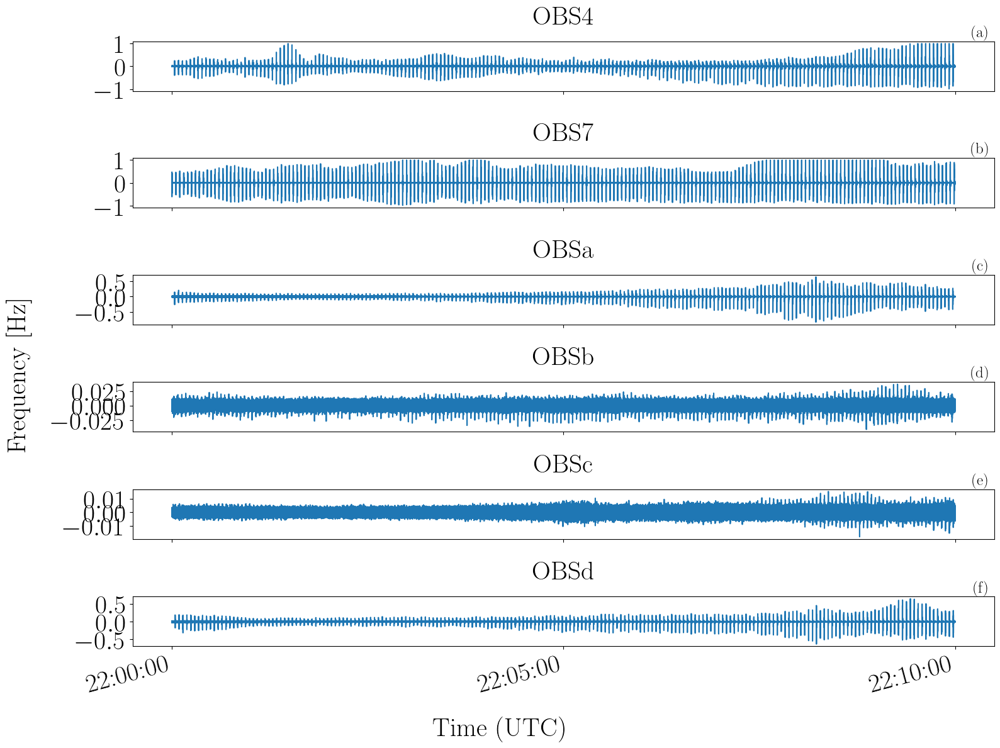

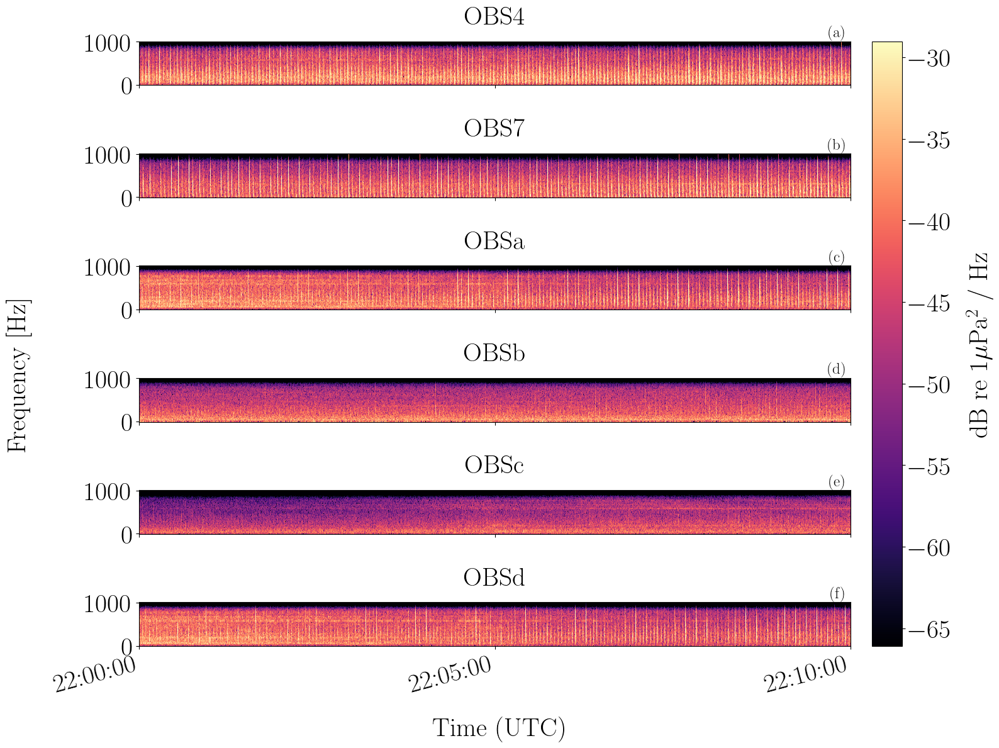

In [ ]:
# datetime_fmt = ds_wav.attrs["datetime_format"]

analysis_duration_s = 10 * 60
start_analysis_dt = "2026-02-24_22-00-00"
# plot_sequence(
#     ds_wav, start_analysis_dt, analysis_duration_s, nperseg=2**8, alpha_overlap=0.75
# )

# analysis_duration_s = 1 * 60
# start_analysis_dt = "2026-02-24_21-28-57"
plot_sequence(
    ds_wav, start_analysis_dt, analysis_duration_s, nperseg=2**7, alpha_overlap=0.75
)

## Métadonnées 

In [ ]:
from scipy.io import loadmat

In [ ]:
root_metadata = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\data\ACOUPLANE\METADATA"
fpath_atl = os.path.join(root_metadata, "Trame_ATL_24.mat")

atl = loadmat(fpath_atl)

In [ ]:
atl

In [58]:
atl["res"][:, 2]

array([740037.        , 740037.00001157, 740037.00002315, ...,
       740037.99996528, 740037.99997685, 740038.        ])

In [59]:
atl
emission_pos = atl["res"]

In [60]:
lat_pos, lon_pos, _ = emission_pos[:, 0], emission_pos[:, 1], emission_pos[:, 2],
lon_pos, lat_pos

(array([5.946851, 5.946819, 5.946787, ..., 5.885005, 5.885003, 5.885002]),
 array([43.028906, 43.028906, 43.028905, ..., 43.022544, 43.022564,
        43.022585]))

In [61]:
# OBS position (from screenshots)

# OBS 4
obs4_lon = 5.98822
obs4_lat = 43.03202

# OBS 7 
obs7_lon = 5.98946
obs7_lat = 43.03172

Text(0, 0.5, 'Latitude [°]')

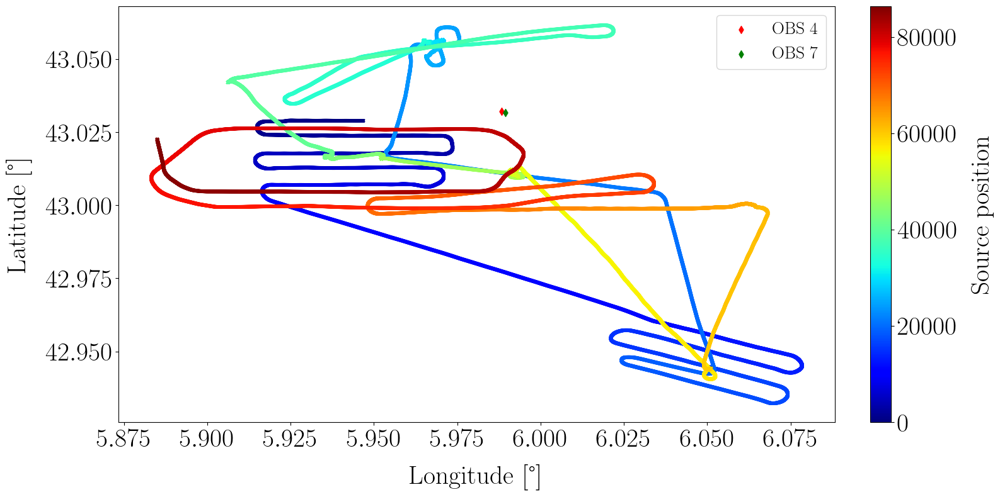

In [62]:
plt.figure()
plt.scatter(obs4_lon, obs4_lat, marker="d", color="r", label="OBS 4")
plt.scatter(obs7_lon, obs7_lat, marker="d", color="g", label="OBS 7")
sc = plt.scatter(lon_pos, lat_pos, cmap="jet", c=np.arange(lat_pos.size), marker="x", s=10)
plt.colorbar(sc, label="Source position")
plt.legend()
plt.xlabel("Longitude [°]")
plt.ylabel("Latitude [°]")

In [63]:
from source.utils.utils_bathy import load_bathy

bathy = load_bathy(
    obs7_lon,
    obs7_lat,
    dlon_box=1,
    dlat_box=1,
)

# Build bathy dataset
ds_bathy = xr.Dataset(
    data_vars=dict(
        elevation=(["lat", "lon"], bathy.elevation.values),
    ),
    coords=dict(
        lon=bathy.lon.values,
        lat=bathy.lat.values,
    ),
    attrs=dict(
        description="Bathymetry data from GEBCO 2021",
        geodesic_frame="WGS84",
    ),
)

# Add attributes to variables
ds_bathy.elevation.attrs["units"] = "m"
ds_bathy.lon.attrs["units"] = "°"
ds_bathy.lat.attrs["units"] = "°"
ds_bathy.elevation.attrs["long_name"] = "Elevation (WGS84)"
ds_bathy.lon.attrs["long_name"] = "Longitude"
ds_bathy.lat.attrs["long_name"] = "Latitude"

# Save to netCDF
fname = "bathy.nc"
fpath = os.path.join(root_data, fname)
ds_bathy.to_netcdf(fpath)

In [64]:
ds_bathy

<xarray.Dataset> Size: 119kB
Dimensions:    (lat: 240, lon: 240)
Coordinates:
  * lat        (lat) float64 2kB 42.54 42.54 42.54 42.55 ... 43.52 43.53 43.53
  * lon        (lon) float64 2kB 5.49 5.494 5.498 5.502 ... 6.477 6.481 6.485
Data variables:
    elevation  (lat, lon) int16 115kB -2294 -2303 -2312 -2308 ... 187 194 198
Attributes:
    description:     Bathymetry data from GEBCO 2021
    geodesic_frame:  WGS84

c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


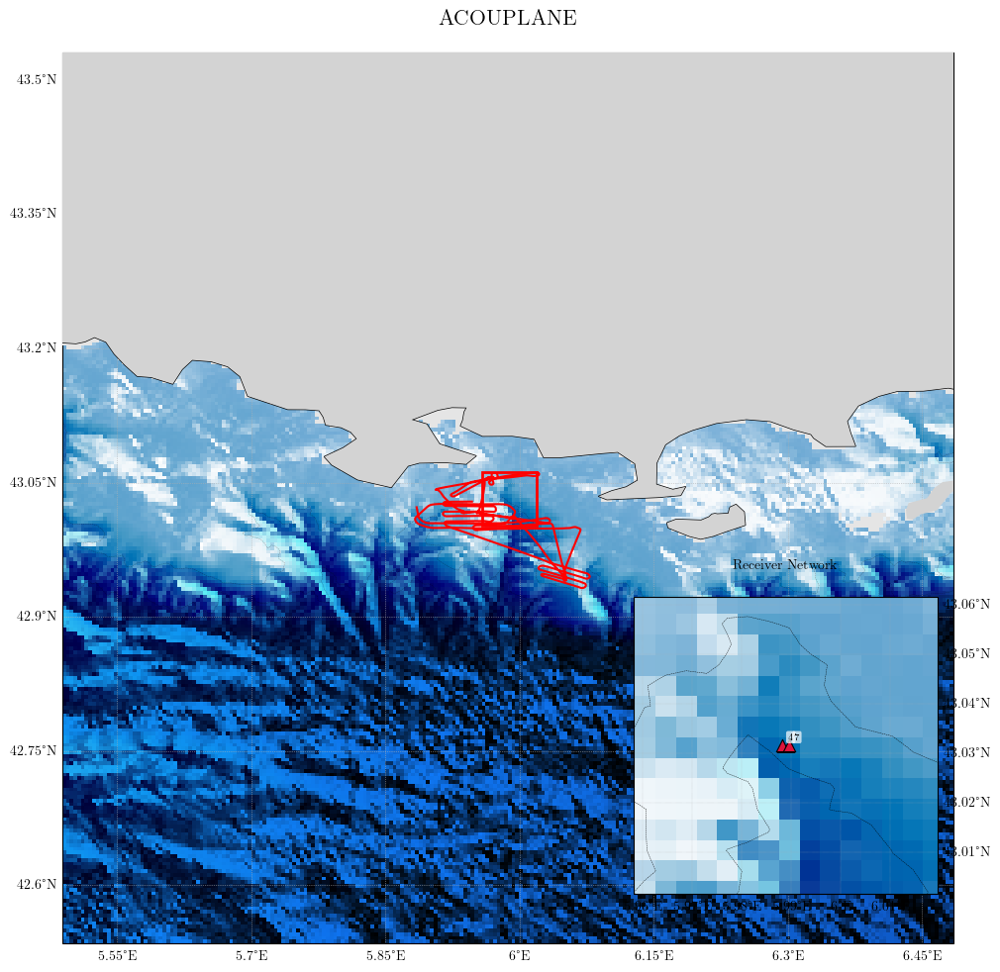

In [65]:
import numpy as np
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from matplotlib.colors import LightSource
from matplotlib.patches import Rectangle

# # =============================================================================
# # INPUT DATA
# # =============================================================================

# Extract data
z = ds_bathy["elevation"].values
lon = ds_bathy["lon"].values
lat = ds_bathy["lat"].values

# Receiver dataset
rx_lon = np.array([obs4_lon, obs7_lon])
rx_lat = np.array([obs7_lat, obs7_lat])
rx_id = [4, 7]

# =============================================================================
# DEFINE ZOOM AREA FROM RECEIVER NETWORK
# =============================================================================

pad = 0.03  # degrees

zoom_extent = [
    rx_lon.min() - pad,
    rx_lon.max() + pad,
    rx_lat.min() - pad,
    rx_lat.max() + pad,
]

# =============================================================================
# HILLSHADE
# =============================================================================

ls = LightSource(
    azdeg=315,
    altdeg=45,
)

# Hillshade computed on bathymetry
rgb = ls.shade(
    -z,  # invert bathymetry for proper relief
    cmap=plt.cm.Blues,
    vert_exag=8,
    blend_mode="overlay",
)


# =============================================================================
# FIGURE
# =============================================================================

fig = plt.figure(figsize=(14, 10))

# -----------------------------------------------------------------------------
# MAIN MAP
# -----------------------------------------------------------------------------

ax = fig.add_axes(
    [0.05, 0.05, 0.90, 0.90],
    projection=ccrs.PlateCarree(),
)

ax.imshow(
    rgb,
    origin="lower",
    extent=[lon.min(), lon.max(), lat.min(), lat.max()],
    transform=ccrs.PlateCarree(),
)

# Bathymetric contours
levels = np.arange(
    np.floor(z.min() / 100) * 100,
    0,
    1000,
)

cs = ax.contour(
    lon,
    lat,
    z,
    levels=levels,
    colors="k",
    linewidths=0.3,
    alpha=0.4,
    transform=ccrs.PlateCarree(),
)


# Zoom rectangle
rect = Rectangle(
    (zoom_extent[0], zoom_extent[2]),
    zoom_extent[1] - zoom_extent[0],
    zoom_extent[3] - zoom_extent[2],
    fill=False,
    edgecolor="red",
    linewidth=2,
    transform=ccrs.PlateCarree(),
    zorder=20,
)

ax.add_patch(rect)

# Grid
gl = ax.gridlines(
    draw_labels=True,
    linestyle=":",
    linewidth=0.5,
)

gl.top_labels = False
gl.right_labels = False

ax.set_title(
    # "Bathymetry and Receiver Network",
    "ACOUPLANE",
    fontsize=16,
)


# Create mask
land_mask = z >= 0

# Land color (RGB)
land_color = np.array([0.9, 0.9, 0.9])

# Replace land pixels by a uniform color
rgb_land = rgb.copy()
rgb_land[land_mask, :3] = land_color
rgb_land[~land_mask] = np.nan


ax.imshow(
    rgb_land,
    origin="lower",
    extent=[lon.min(), lon.max(), lat.min(), lat.max()],
    transform=ccrs.PlateCarree(),
    zorder=16,
)

# Coastlines and land
ax.coastlines(resolution="10m", linewidth=1, zorder=17)
ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=17)

sc = ax.plot(lon_pos, lat_pos, color="r")

# =============================================================================
# INSET MAP
# =============================================================================

axins = fig.add_axes(
    [0.55, 0.10, 0.30, 0.30],  # left, bottom, width, height
    projection=ccrs.PlateCarree(),
)

# Bathymetry in inset
axins.imshow(
    rgb,
    origin="lower",
    extent=[lon.min(), lon.max(), lat.min(), lat.max()],
    transform=ccrs.PlateCarree(),
)

# Bathymetric contours
levels = np.arange(
    np.floor(z.min() / 100) * 100,
    0,
    500,
)

# Contours
cs = axins.contour(
    lon,
    lat,
    z,
    levels=levels,
    colors="k",
    linewidths=0.3,
    alpha=1,
    transform=ccrs.PlateCarree(),
)


# Receivers
axins.scatter(
    rx_lon,
    rx_lat,
    s=80,
    c="crimson",
    marker="^",
    edgecolors="black",
    linewidths=0.8,
    transform=ccrs.PlateCarree(),
    zorder=40,
)

# Receiver labels
for rid, x, y in zip(rx_id, rx_lon, rx_lat):
    axins.annotate(
        str(rid),
        (x, y),
        xytext=(4, 4),
        textcoords="offset points",
        fontsize=7,
        bbox=dict(
            boxstyle="round,pad=0.2",
            fc="white",
            ec="none",
            alpha=0.7,
        ),
        zorder=41,
    )

# Zoom extent
axins.set_extent(zoom_extent)

# Grid
gl2 = axins.gridlines(
    draw_labels=True,
    linestyle=":",
    linewidth=0.3,
)

gl2.top_labels = False
gl2.right_labels = True
gl2.left_labels = False

axins.set_title(
    "Receiver Network",
    fontsize=10,
)


plt.show()

C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_38408\1658138771.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=18, ncol=2)


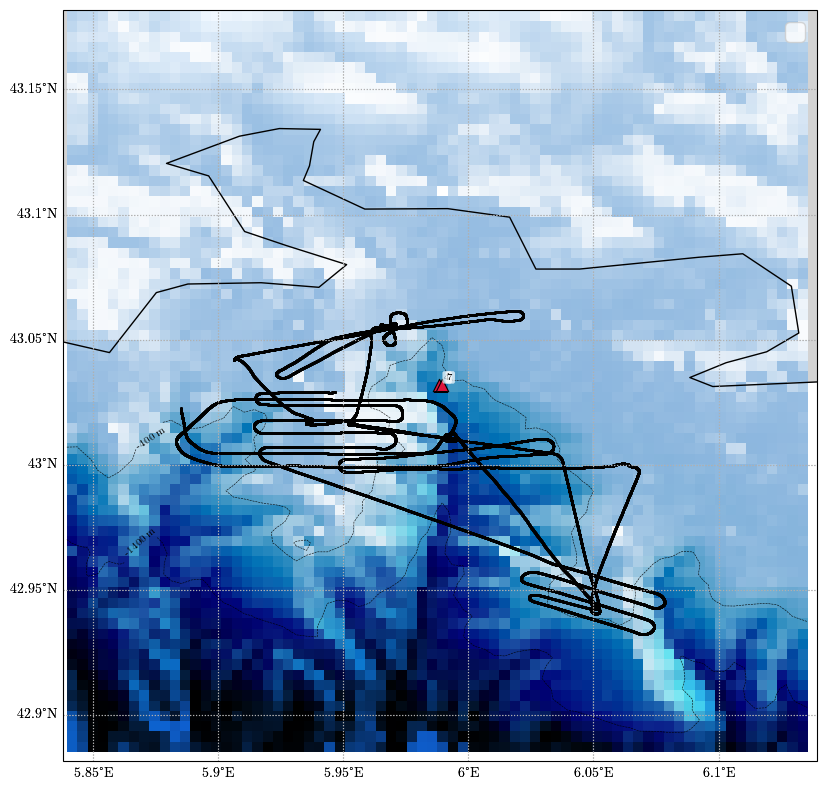

In [66]:
# Plot source position for selected ranges
pad = 0.15  # degrees

zoom_extent = [
    rx_lon.min() - pad,
    rx_lon.max() + pad,
    rx_lat.min() - pad,
    rx_lat.max() + pad,
]

bathy_zoom = ds_bathy.sel(
    lon=slice(zoom_extent[0], zoom_extent[1]), lat=slice(zoom_extent[2], zoom_extent[3])
)


z = bathy_zoom["elevation"].values
lon = bathy_zoom["lon"].values
lat = bathy_zoom["lat"].values

# Hillshade
ls = LightSource(azdeg=315, altdeg=45)  # illumination azimuth  # illumination elevation
rgb = ls.shade(-z, cmap=plt.cm.Blues, vert_exag=5, blend_mode="overlay")

# Figure
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())


# Shaded bathymetry
ax.imshow(
    rgb,
    origin="lower",
    extent=[lon.min(), lon.max(), lat.min(), lat.max()],
    transform=ccrs.PlateCarree(),
)

# Optional depth contours
levels = np.arange(np.floor(z.min() / 100) * 100, 0, 1000)

cs = ax.contour(
    lon,
    lat,
    z,
    levels=levels,
    colors="k",
    linewidths=0.4,
    alpha=1,
    transform=ccrs.PlateCarree(),
)

ax.clabel(cs, fmt="%d m", fontsize=7)

# Coastlines
ax.coastlines(resolution="10m", linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")

# Grid
gl = ax.gridlines(draw_labels=True, linestyle=":")
gl.top_labels = False
gl.right_labels = False

# Grid
gl = ax.gridlines(draw_labels=True, linestyle=":")
gl.top_labels = False
gl.right_labels = False

ax.set_title("")

# Receivers
ax.scatter(
    rx_lon,
    rx_lat,
    s=80,
    c="crimson",
    marker="^",
    edgecolors="black",
    linewidths=0.8,
    transform=ccrs.PlateCarree(),
    zorder=10,
)

# Receiver labels
for rid, x, y in zip(rx_id, rx_lon, rx_lat):
    ax.annotate(
        str(rid),
        (x, y),
        xytext=(4, 4),
        textcoords="offset points",
        fontsize=7,
        bbox=dict(
            boxstyle="round,pad=0.2",
            fc="white",
            ec="none",
            alpha=0.7,
        ),
        zorder=11,
    )

# Zoom on the area of interest
ax.set_extent(zoom_extent)


sc = ax.scatter(lon_pos, lat_pos, color="k", marker="x", s=1)
# plt.colorbar(sc)
# plt.tight_layout()

plt.legend(fontsize=18, ncol=2)

# plt.show()
# plt.xlim(70.8, 70.7)

In [67]:
delta_lon = np.diff(lon_pos)
delta_lat = np.diff(lat_pos)

## Détection des arrivées 

### STA / LTA 

In [68]:
def apply_sta_lta(
    ds_wav,
    sta_duration,
    lta_duration,
    start_analysis_dt,
    analysis_duration_s,
    threshold_obs4,
    threshold_obs7,
):

    datetime_fmt = ds_wav.attrs["datetime_format"]

    # Analysis bounds
    t_start = datetime.strptime(start_analysis_dt, datetime_fmt)
    t_end = t_start + timedelta(seconds=analysis_duration_s)

    thresholds = [threshold_obs4, threshold_obs7]

    # Arrivals
    arrivals_dt = []
    sig_dt = []
    signals = []
    arrivals_dt_idx = []

    for i, id_ in enumerate(ds_wav.obs_id.values):
        
        obs_id = dict_corresp_before_verif[id_]     # UPDATE TODO after verif 

        fig, axs = plt.subplots(3, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        datetime_fmt = ds_wav.attrs["datetime_format"]

        sig_varname = f"signal_obs{obs_id}"
        time_coordsname = f"time{obs_id}"
        signal = ds_wav[sig_varname]

        # Select a window of the signal
        # fs = ds_wav.attrs[f"fs_obs{obs_id}"]
        fs = ds_wav.fs.sel(obs_id=id_).values

        # Start of recording
        t0 = ds_wav.attrs[f"start_datetime_obs{obs_id}"]
        t0 = datetime.strptime(t0, datetime_fmt)

        # Select window
        t_from_t0_start_s = (t_start - t0).total_seconds()
        n_start = int(t_from_t0_start_s * fs)
        t_from_t0_end_s = (t_end - t0).total_seconds()
        n_end = int(t_from_t0_end_s * fs)

        # Slice signal
        sig_win = signal.isel({time_coordsname: slice(n_start, n_end)})
        signals.append(sig_win)

        # STA/LTA params
        sta_n = int(sta_duration * fs)
        lta_n = int(lta_duration * fs)
        # STA
        sig_sta = np.abs(sig_win).rolling({time_coordsname: sta_n}, center=True).mean()
        # LTA
        sig_lta = np.abs(sig_win).rolling({time_coordsname: lta_n}, center=True).mean()
        # STA / LTA
        sta_lta = sig_sta.values / sig_lta.values 
        # Normalize
        sta_lta /= np.nanmax(sta_lta)

        # Detect

        # Define datetime borders
        t0_slice = t0 + timedelta(seconds=n_start * 1 / fs)
        t1_slice = t0 + timedelta(seconds=n_end * 1 / fs)

        # Associated datetime vector
        tt_datetime = pd.date_range(
            t0_slice,
            t1_slice,
            freq=f"{1 / fs}s",
            inclusive="left",
        )
        sig_dt.append(tt_datetime)

        # Plot
        axs[0].plot(tt_datetime, sig_win, color="k")
        axs[1].plot(tt_datetime, sig_sta, color="r", label="STA")
        axs[1].plot(tt_datetime, sig_lta, color="b", label="LTA")
        axs[2].plot(tt_datetime, sta_lta, color="k", label="STA/LTA")

        # Add threshold
        threshold = thresholds[i]
        axs[2].axhline(threshold, color="r", linestyle="--", label="Detection threshold")
        detect_mask = sta_lta >= threshold
        axs[2].plot(
            tt_datetime,
            detect_mask,
            color="b",
        )

        # Detect arrivals
        diff_mask = np.diff(detect_mask.astype(int))
        up_front = diff_mask > 0
        up_front = np.append(up_front, False)
        arr_dt_idx = np.arange(tt_datetime.size)[up_front]
        arrivals_dt_idx.append(arr_dt_idx)
        arr_dt = tt_datetime[up_front]
        arrivals_dt.append(arr_dt)

        for arr in arr_dt:
            axs[0].axvline(arr, color="r", linestyle="--")

        for ax in axs:
            ax.legend()

        fig.suptitle(f"OBS{obs_id}")

        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
        axs[-1].xaxis.set_major_locator(locator)
        plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

        fig.supylabel("Amplitude")
        fig.supxlabel("Time (UTC)")

        set_subfigures_abc_labels(
            axs=axs,
            fontsize=18,
            x_pos=0.995,
            y_pos=1.02,
            ha="right",
            va="bottom",
        )

    return sig_dt, signals, arrivals_dt, arrivals_dt_idx

In [69]:
# interval_inter_pulse_s = 3
# sta_duration = 0.45
# lta_duration = 3
# sta_lta_threshold_obs4 = 0.5
# sta_lta_threshold_obs7 = 0.65

# sig_dt, signals, arrivals_dt, arrivals_dt_idx = apply_sta_lta(
#     ds_wav,
#     sta_duration,
#     lta_duration,
#     start_analysis_dt,
#     analysis_duration_s,
#     sta_lta_threshold_obs4,
#     sta_lta_threshold_obs7,
# )

In [70]:
def apply_sta_lta_only_first(
    ds_wav,
    sta_duration,
    lta_duration,
    start_analysis_dt,
    analysis_duration_s,
    thresholds,
    pulse_interval_s=3,
    fs=2000,
):

    pulse_sample_offset = int(pulse_interval_s * fs)
    datetime_fmt = ds_wav.attrs["datetime_format"]

    # Analysis bounds
    t_start = datetime.strptime(start_analysis_dt, datetime_fmt)
    t_end = t_start + timedelta(seconds=analysis_duration_s)

    # Arrivals
    arrivals_dt = []
    sig_dt = []
    signals = []
    arrivals_dt_idx = []

    for i, id_ in enumerate(ds_wav.obs_id.values):
        
        obs_id = dict_corresp_before_verif[id_]     # UPDATE TODO after verif 

        fig, axs = plt.subplots(1, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        datetime_fmt = ds_wav.attrs["datetime_format"]

        sig_varname = f"signal_obs{obs_id}"
        time_coordsname = f"time{obs_id}"
        signal = ds_wav[sig_varname]

        # Select a window of the signal
        # fs = ds_wav.attrs[f"fs_obs{obs_id}"]
        fs = ds_wav.fs.sel(obs_id=id_).values

        # Start of recording
        t0 = ds_wav.attrs[f"start_datetime_obs{obs_id}"]
        t0 = datetime.strptime(t0, datetime_fmt)

        # Select window
        t_from_t0_start_s = (t_start - t0).total_seconds()
        n_start = int(t_from_t0_start_s * fs)
        t_from_t0_end_s = (t_end - t0).total_seconds()
        n_end = int(t_from_t0_end_s * fs)

        # Slice signal
        sig_win = signal.isel({time_coordsname: slice(n_start, n_end)})
        signals.append(sig_win)

        # STA/LTA params
        sig_win_sta_lta = signal.isel({time_coordsname: slice(n_start, n_start + pulse_sample_offset*3)})
        sta_n = int(sta_duration * fs)
        lta_n = int(lta_duration * fs)
        # STA
        sig_sta = (
            np.abs(sig_win_sta_lta)
            .rolling({time_coordsname: sta_n}, center=True)
            .mean()
        )
        # LTA
        sig_lta = (
            np.abs(sig_win_sta_lta)
            .rolling({time_coordsname: lta_n}, center=True)
            .mean()
        )
        # STA / LTA
        sta_lta = sig_sta.values / sig_lta.values
        # Normalize
        sta_lta /= np.nanmax(sta_lta)

        # Define datetime borders
        t0_slice = t0 + timedelta(seconds=n_start * 1 / fs)
        t1_slice = t0 + timedelta(seconds=n_end * 1 / fs)

        # Associated datetime vector
        tt_datetime = pd.date_range(
            t0_slice,
            t1_slice,
            freq=f"{1 / fs}s",
            inclusive="left",
        )
        tt_datetime_sta_lta = pd.date_range(
            t0_slice,
            t0 + timedelta(seconds=(n_start + pulse_sample_offset * 3) * 1 / fs),
            freq=f"{1 / fs}s",
            inclusive="left",
        )

        sig_dt.append(tt_datetime)

        # Plot
        axs[0].plot(tt_datetime, sig_win, color="k")

        # Add threshold
        threshold = thresholds[i]
        detect_mask = sta_lta >= threshold

        # Detect arrivals
        diff_mask = np.diff(detect_mask.astype(int))
        up_front = diff_mask > 0
        up_front = np.append(up_front, False)
        arr_dt_idx = np.arange(tt_datetime_sta_lta.size)[up_front]
        # arr_dt = tt_datetime[up_front]

        # Keep only first detection and get the other using interval
        arr_dt_idx_0 = arr_dt_idx[0]
        k = 0
        arr_dt_idx_k = arr_dt_idx_0 + pulse_sample_offset * k
        arr_dt_idx = []
        while arr_dt_idx_k < tt_datetime.size:
            arr_dt_idx.append(arr_dt_idx_k)
            k += 1
            arr_dt_idx_k = arr_dt_idx_0 + pulse_sample_offset * k

        arr_dt_idx = np.array(arr_dt_idx)
        arr_dt = tt_datetime[arr_dt_idx]

        arrivals_dt_idx.append(arr_dt_idx)
        arrivals_dt.append(arr_dt)

        for arr in arr_dt:
            axs[0].axvline(arr, color="r", linestyle="--")

        for ax in axs:
            ax.legend()
            ax.set_xlim(tt_datetime_sta_lta[0], tt_datetime_sta_lta[-1])

        fig.suptitle(f"OBS{obs_id}")

        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
        axs[-1].xaxis.set_major_locator(locator)
        plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

        fig.supylabel("Amplitude")
        fig.supxlabel("Time (UTC)")

        set_subfigures_abc_labels(
            axs=axs,
            fontsize=18,
            x_pos=0.995,
            y_pos=1.02,
            ha="right",
            va="bottom",
        )

    return sig_dt, signals, arrivals_dt, arrivals_dt_idx

C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_38408\2985049909.py:131: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_38408\2985049909.py:131: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_38408\2985049909.py:131: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_38408\2985049909.py:131: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are 

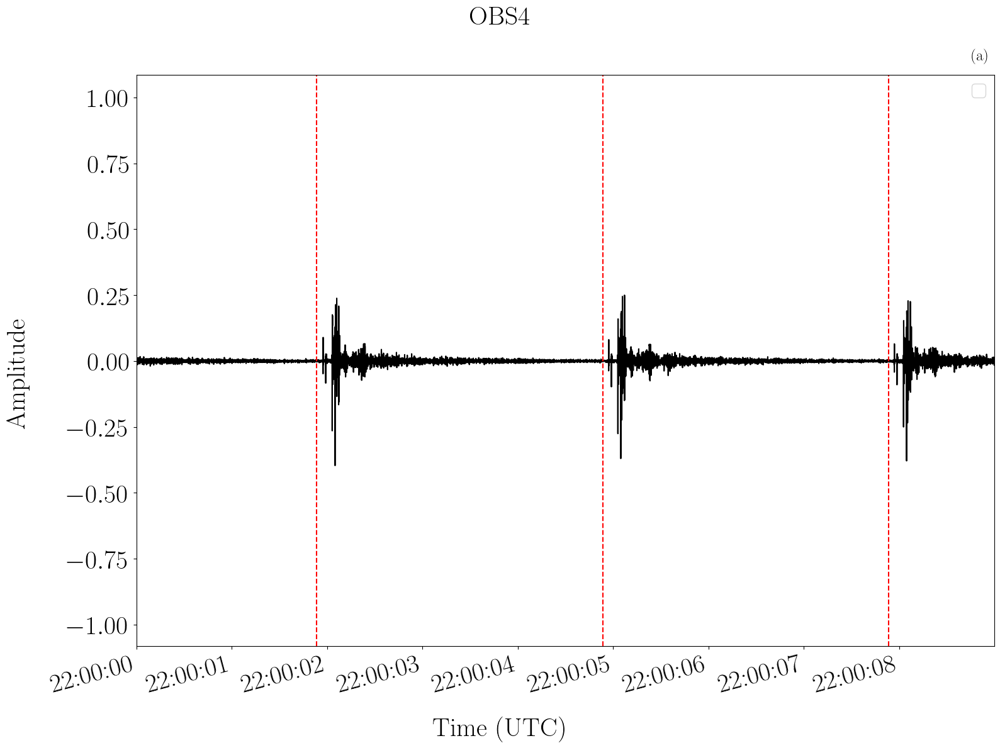

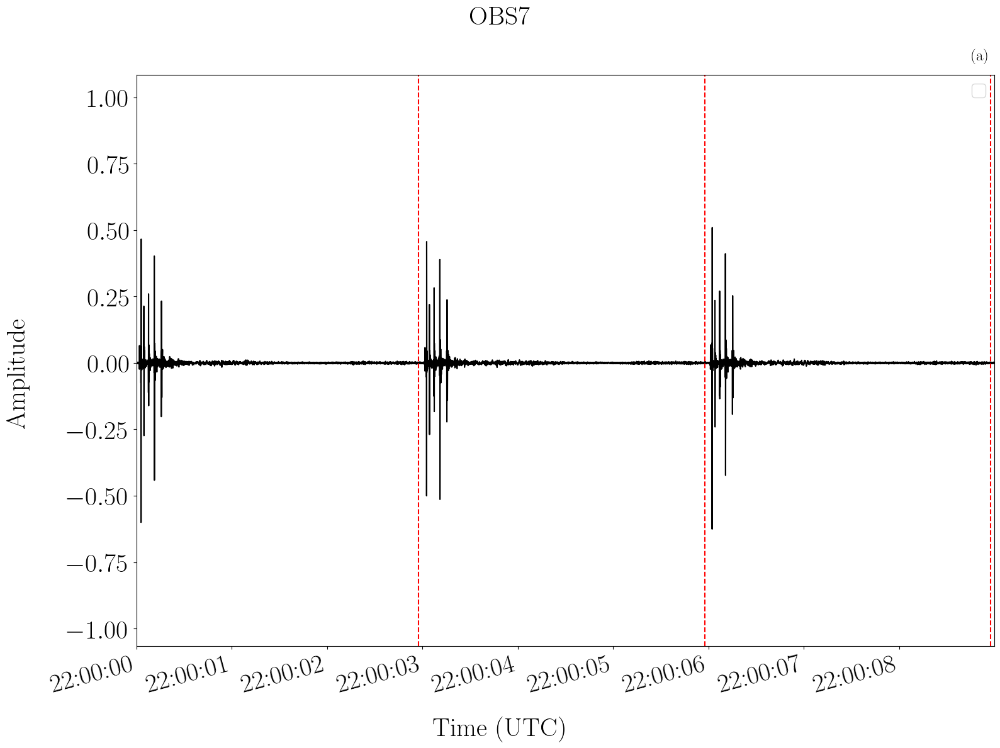

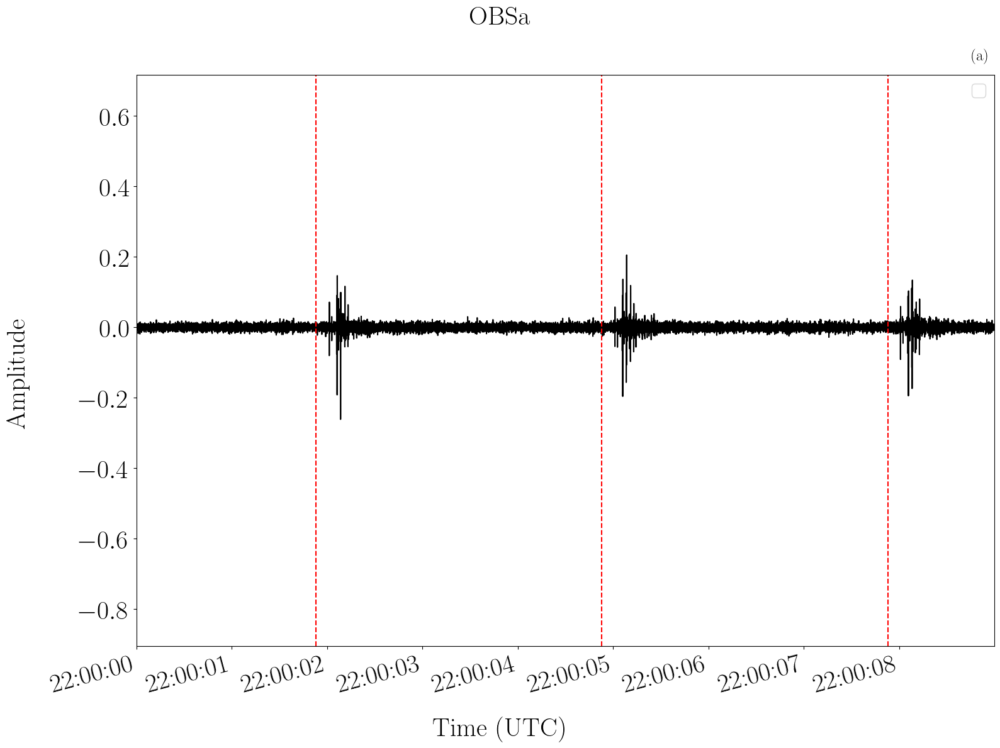

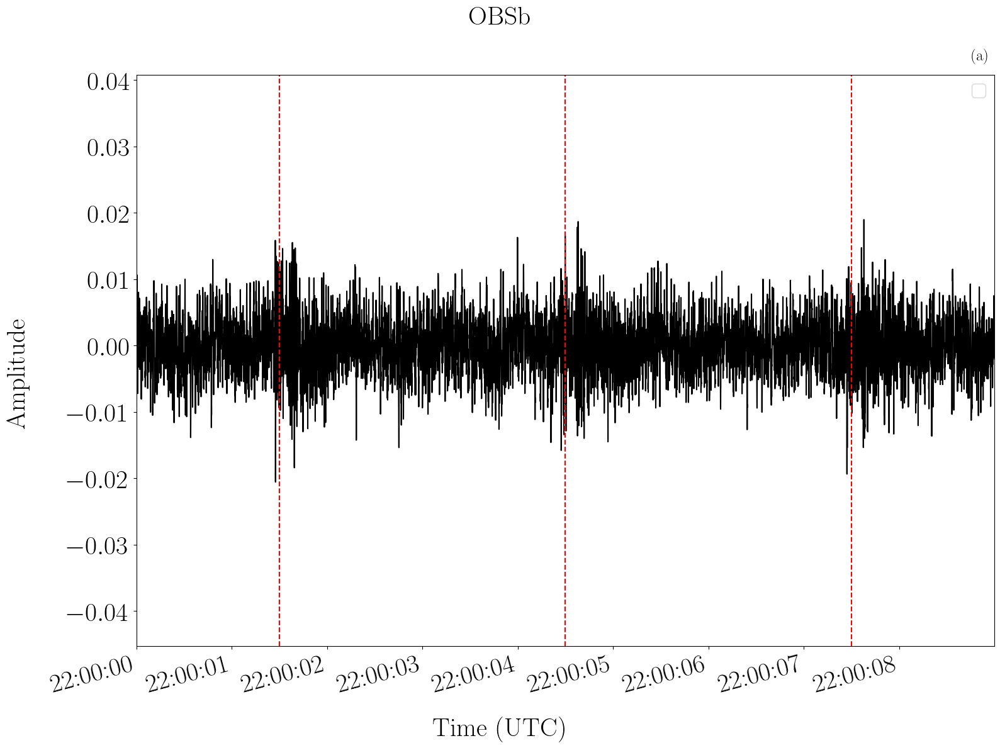

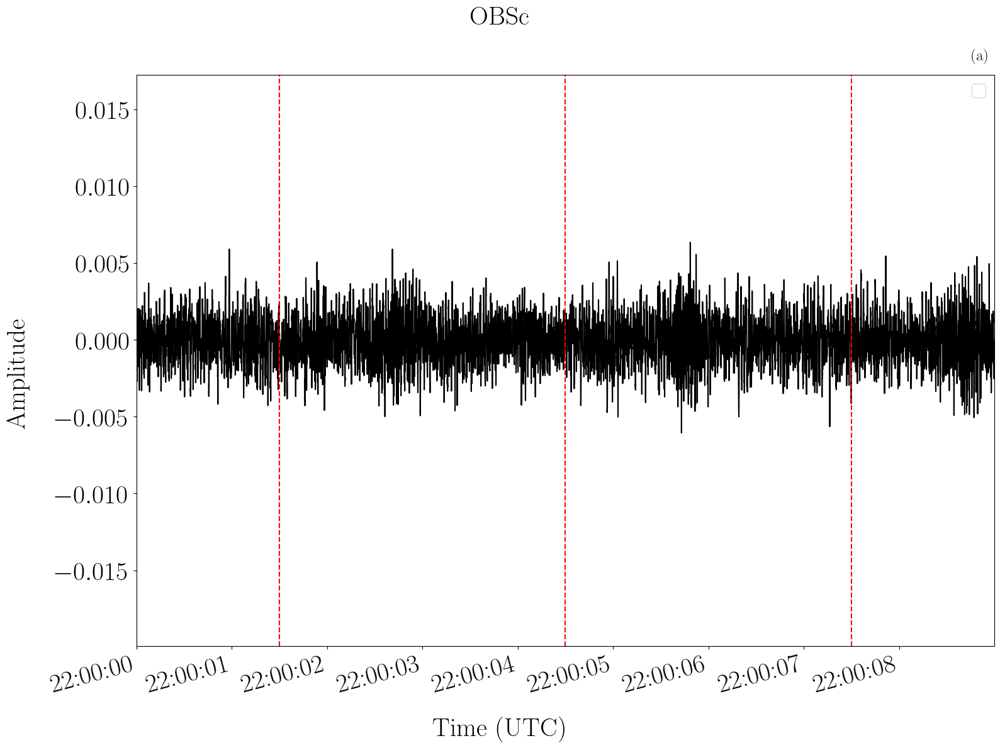

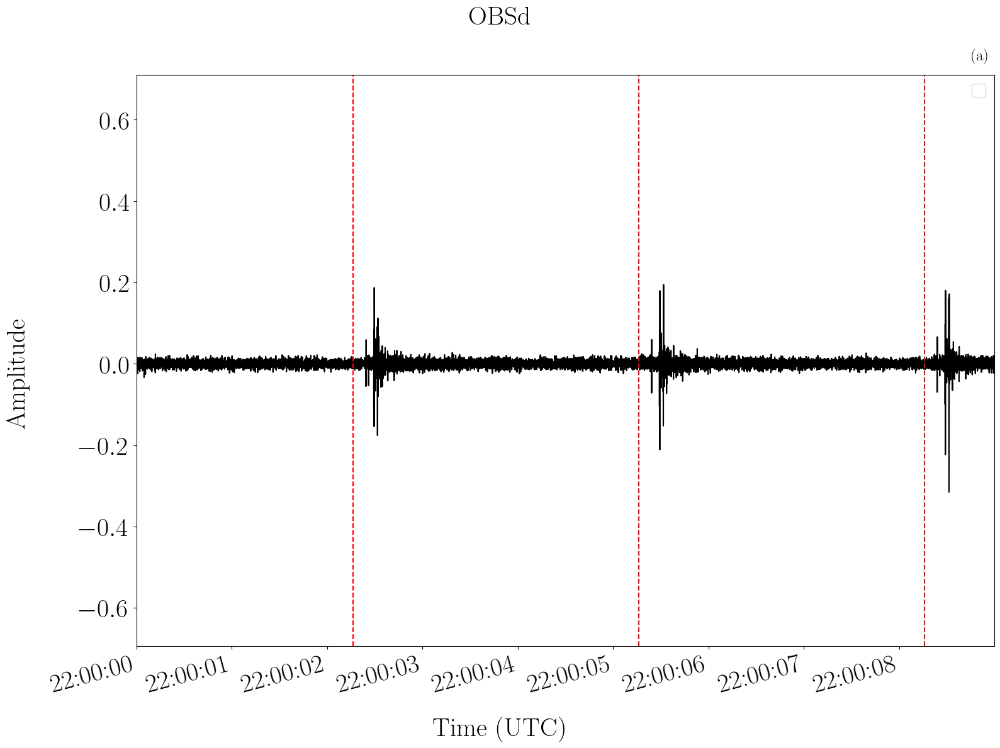

In [71]:
interval_inter_pulse_s = 3
sta_duration = 0.45
lta_duration = 3
sta_lta_threshold_obs4 = 0.5
sta_lta_threshold_obs7 = 0.65
sta_lta_threshold_obsa = 0.5
sta_lta_threshold_obsb = 0.5
sta_lta_threshold_obsc = 0.5
sta_lta_threshold_obsd = 0.5

thresholds = [
    sta_lta_threshold_obs4,
    sta_lta_threshold_obs7,
    sta_lta_threshold_obsa,
    sta_lta_threshold_obsb,
    sta_lta_threshold_obsc,
    sta_lta_threshold_obsd,
]

sig_dt, signals, arrivals_dt, arrivals_dt_idx = apply_sta_lta_only_first(
    ds_wav,
    sta_duration,
    lta_duration,
    start_analysis_dt,
    analysis_duration_s,
    thresholds,
    pulse_interval_s=interval_inter_pulse_s,
    fs=fs1,
)

Attention, il y a une ambiguïté pour associer les paires de réceptions, il faut vérifier à l'aide des données de positions. 

In [72]:
arrivals_dt

[DatetimeIndex(['2026-02-24 22:00:01.890500', '2026-02-24 22:00:04.890500',
                '2026-02-24 22:00:07.890500', '2026-02-24 22:00:10.890500',
                '2026-02-24 22:00:13.890500', '2026-02-24 22:00:16.890500',
                '2026-02-24 22:00:19.890500', '2026-02-24 22:00:22.890500',
                '2026-02-24 22:00:25.890500', '2026-02-24 22:00:28.890500',
                ...
                '2026-02-24 22:09:31.890500', '2026-02-24 22:09:34.890500',
                '2026-02-24 22:09:37.890500', '2026-02-24 22:09:40.890500',
                '2026-02-24 22:09:43.890500', '2026-02-24 22:09:46.890500',
                '2026-02-24 22:09:49.890500', '2026-02-24 22:09:52.890500',
                '2026-02-24 22:09:55.890500', '2026-02-24 22:09:58.890500'],
               dtype='datetime64[ns]', length=200, freq=None),
 DatetimeIndex(['2026-02-24 22:00:02.961000', '2026-02-24 22:00:05.961000',
                '2026-02-24 22:00:08.961000', '2026-02-24 22:00:11.961000',
    

## Estimation des RTFs 

### Estimation pour des signaux non stationnaire 

On suppose le bruit négligeable : 

$$
X_1(f) = H_1(f) S(f) + V_1(f) \approx X_1(f) = H_1(f) S(f) 
$$

et

$$
X_2(f) = H_2(f) S(f) + V_2(f) \approx X_2(f) = H_2(f) S(f) 
$$

et le rapport des fonctions de transfert est estimé par : 


$$
\Pi(f) = \frac{S_{21}(f)}{S_{11}(f)}
$$

$$
\frac{S_{21}(f)}{S_{11}(f)} = \frac{ X_2(f) \overline{X_1}(f)}{\lvert X_1 (f) \rvert} \approx \frac{H_2(f) \overline{H_1}(f) \lvert S(f) \rvert^2}{\lvert H_1 (f) \rvert^2 \lvert S(f) \rvert^2} = \frac{H_{2}(f)}{H_{1}(f)}
$$

#### Option 1 : Fenêtre temporelle commune 

Par définition le rapport doit a priori être évalué à l'aide des signaux reçus sur la même fenêtre temporelle. Néanmoins, puisque la source émet une suite de signaux impulsionnels, le choix de la fenêtre n'est pas évident. La première option envisagée est de débuter la fenêtre à l'instant de réception du signal sur le capteur le plus proche (premier temps d'arrivée). 

Le principal écueil de cette approche est le risque de considérer une partie du signal de l'émission précèdente. 

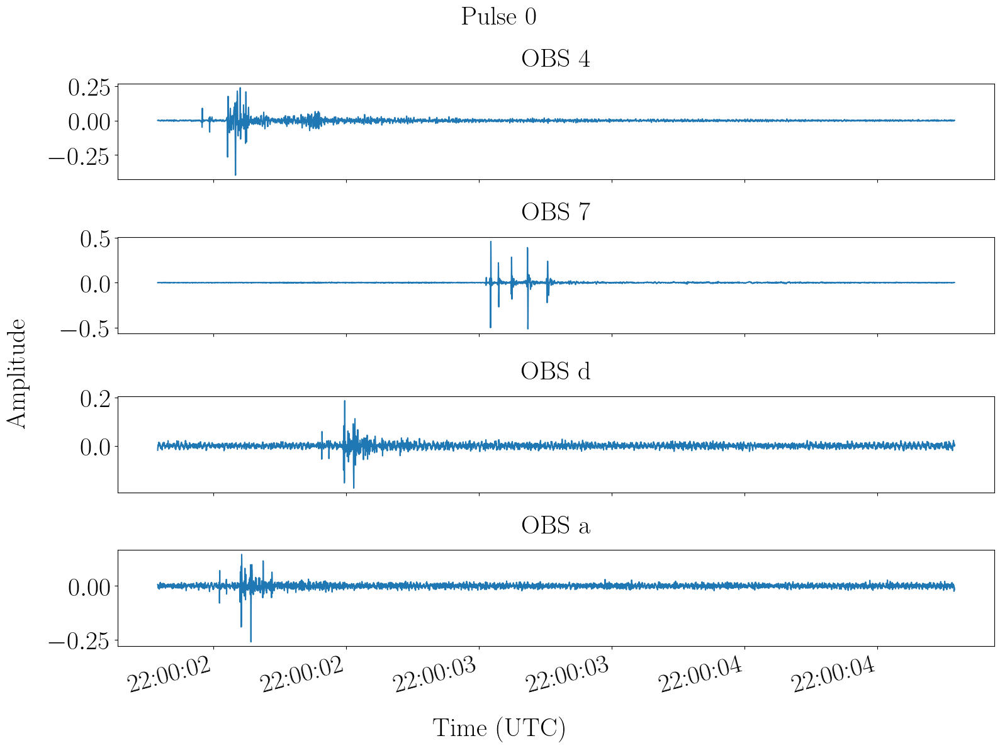

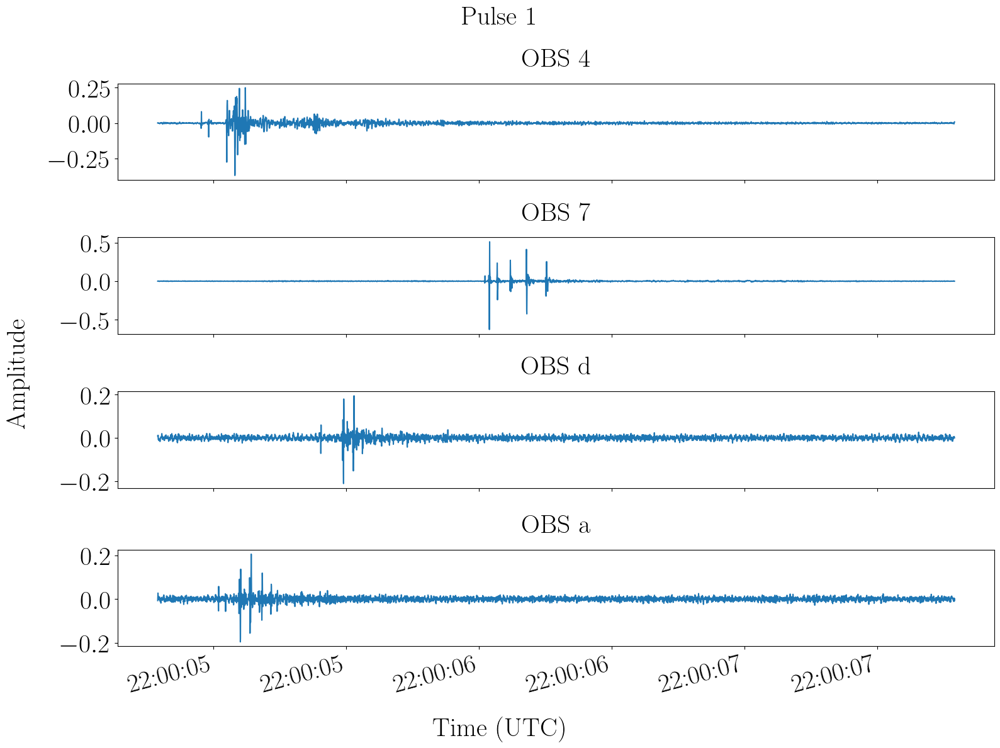

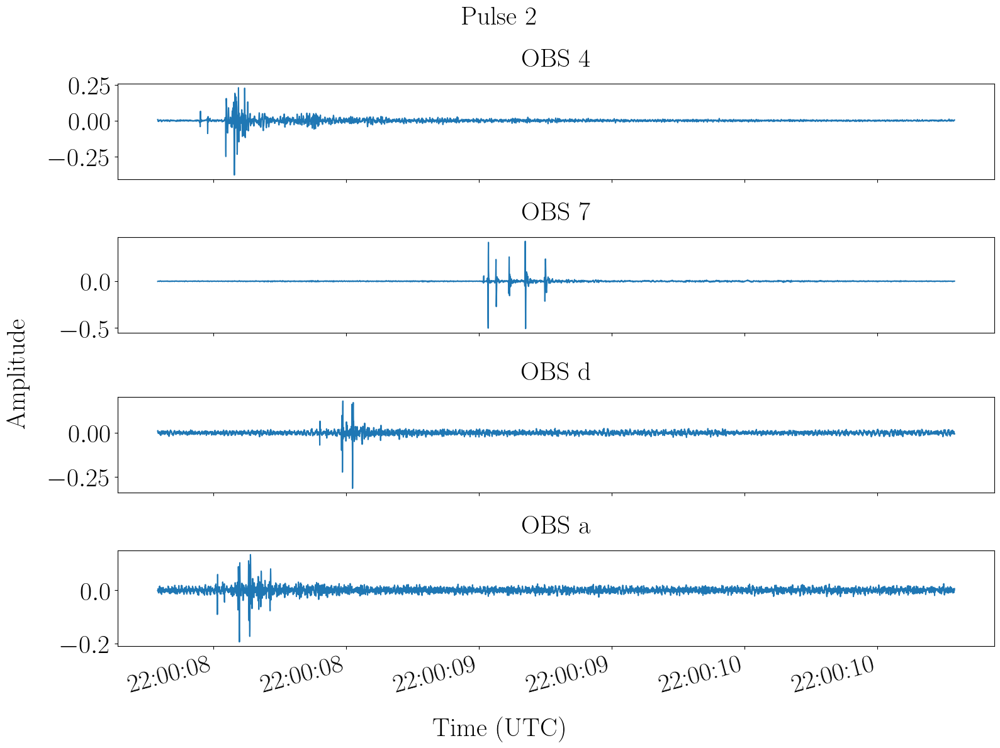

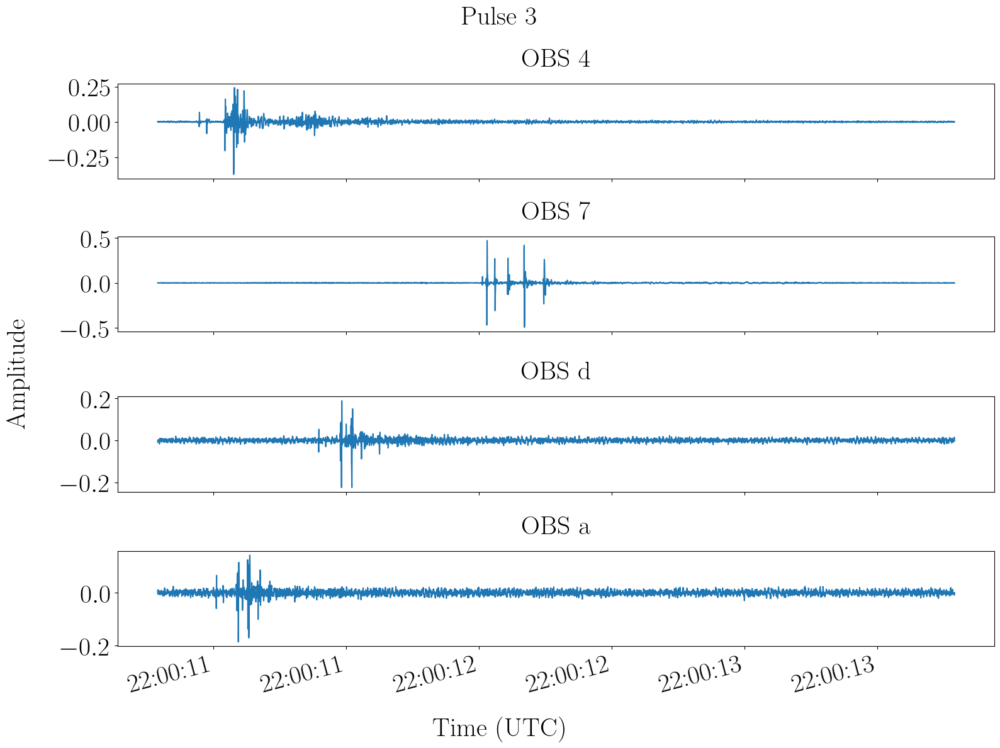

In [73]:
offset_s = 0.1
fs = 2000
n_offset = int(offset_s * fs)

# OBS 4
arr_dt_obs4 = arrivals_dt[0]
arr_dt_idx_obs4 = arrivals_dt_idx[0]
sig_obs4 = signals[0]
obs4_dt = sig_dt[0]
# OBS 7
arr_dt_obs7 = arrivals_dt[1]
arr_dt_idx_obs7 = arrivals_dt_idx[1]
sig_obs7 = signals[1]
obs7_dt = sig_dt[1]
# OBS d
arr_dt_obsd = arrivals_dt[5]
arr_dt_idx_obsd= arrivals_dt_idx[5]
sig_obsd = signals[5]
obsd_dt = sig_dt[5]
# OBS a
arr_dt_obsa = arrivals_dt[2]
arr_dt_idx_obsa = arrivals_dt_idx[2]
sig_obsa = signals[2]
obsa_dt = sig_dt[2]

# print(arr_dt_obs)
for j in range(arr_dt_obs4.size):
    # OBS 4
    arr_obs4 = arr_dt_obs4[j]
    idx_start_obs4 = arr_dt_idx_obs4[j]
    # print(arr_obs4, idx_start_obs4)

    # OBS 7
    arr_obs7 = arr_dt_obs7[j]
    idx_start_obs7 = arr_dt_idx_obs7[j]
    # print(arr_obs7, idx_start_obs7)

    # OBS d
    arr_obsd = arr_dt_obsd[j]
    idx_start_obsd = arr_dt_idx_obsd[j]

    # OBS a
    arr_obsa = arr_dt_obsa[j]
    idx_start_obsa = arr_dt_idx_obsa[j]

    if arr_obs4 <= arr_obs7:
        pulse_start_dt = arr_obs4
        pulse_start_idx = idx_start_obs4
    else:
        pulse_start_dt = arr_obs7
        pulse_start_idx = idx_start_obs7

    # Extract pulse : option 1
    pulse_start_idx = pulse_start_idx - n_offset
    pulse_end_idx = pulse_start_idx + int(interval_inter_pulse_s * fs)
    pulse_obs4 = sig_obs4[pulse_start_idx:pulse_end_idx]
    pulse_obs7 = sig_obs7[pulse_start_idx:pulse_end_idx]
    pulse_obsd = sig_obsd[pulse_start_idx:pulse_end_idx]
    pulse_obsa = sig_obsa[pulse_start_idx:pulse_end_idx]

    pulse_start_idx_obs4, pulse_end_idx_obs4 = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obs7, pulse_end_idx_obs7 = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obsd, pulse_end_idx_obsd = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obsa, pulse_end_idx_obsa = pulse_start_idx, pulse_end_idx

    # # Extract pulse
    # pulse_start_idx_obs4 = idx_start_obs4 - n_offset
    # pulse_end_idx_obs4 = pulse_start_idx_obs4 + int(interval_inter_pulse_s * fs)
    # pulse_obs4 = sig_obs4[pulse_start_idx_obs4:pulse_end_idx_obs4]

    # pulse_start_idx_obs7 = idx_start_obs7 - n_offset
    # pulse_end_idx_obs7 = pulse_start_idx_obs7 + int(interval_inter_pulse_s * fs)
    # pulse_obs7 = sig_obs7[pulse_start_idx_obs7:pulse_end_idx_obs7]

    if j < 4:
        fig, axs = plt.subplots(4, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        axs[0].plot(obs4_dt[pulse_start_idx_obs4:pulse_end_idx_obs4], pulse_obs4)
        axs[0].set_title("OBS 4")
        axs[1].plot(obs7_dt[pulse_start_idx_obs7:pulse_end_idx_obs7], pulse_obs7)
        axs[1].set_title("OBS 7")
        axs[2].plot(obsd_dt[pulse_start_idx_obsd:pulse_end_idx_obsd], pulse_obsd)
        axs[2].set_title("OBS d")
        axs[3].plot(obsa_dt[pulse_start_idx_obsa:pulse_end_idx_obsa], pulse_obsa)
        axs[3].set_title("OBS a")

        fig.suptitle(f"Pulse {j}")

        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
        axs[-1].xaxis.set_major_locator(locator)
        plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

        fig.supylabel("Amplitude")
        fig.supxlabel("Time (UTC)")


Ici, le signal est d'abord reçu sur l'OBS 4 puis sur l'OBS 7 (ou inversement, cf remarque sur l'ambiguïté ci-dessus). Ainsi, la première partie du signal considéré pour l'OBS 7 correspond à l'émission précédente (et donc à la position de source précédente). 

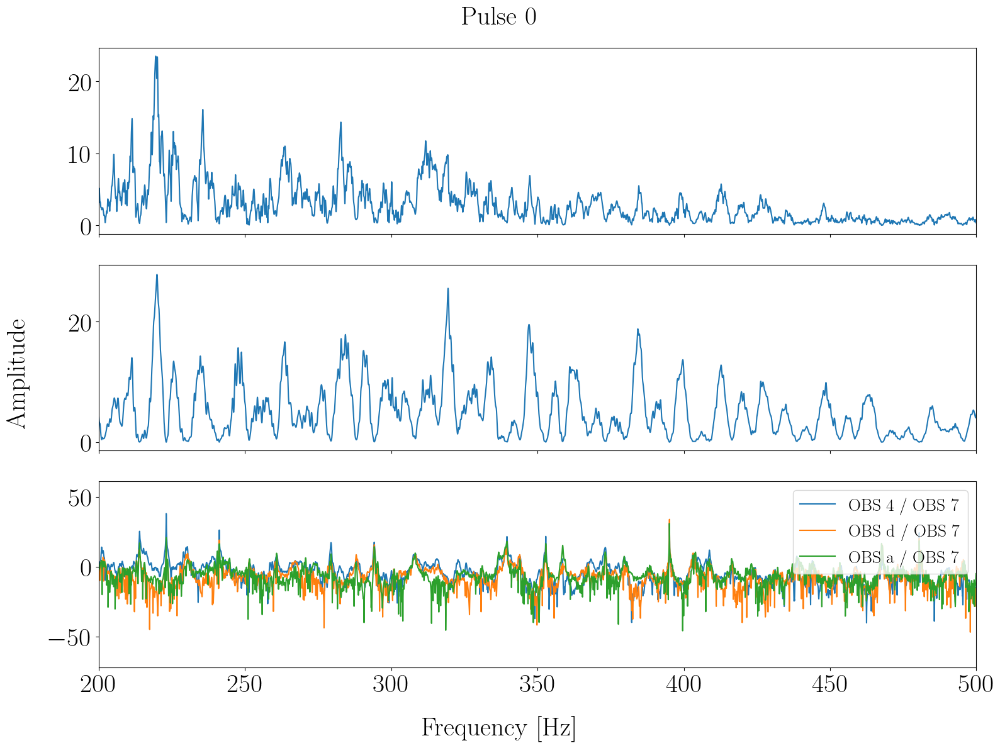

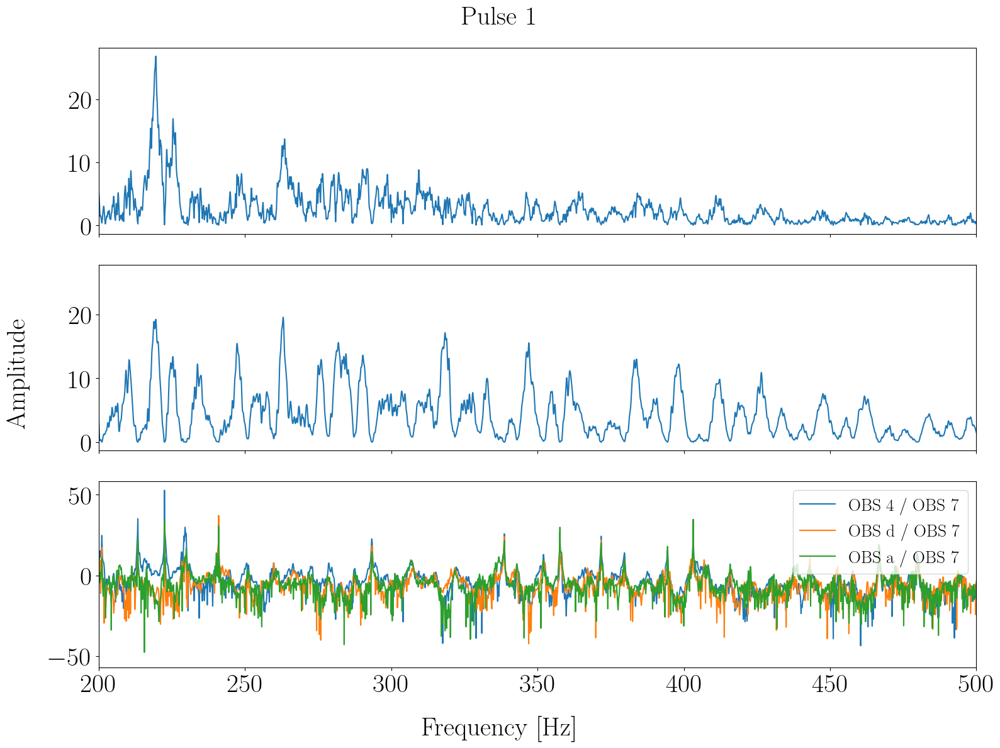

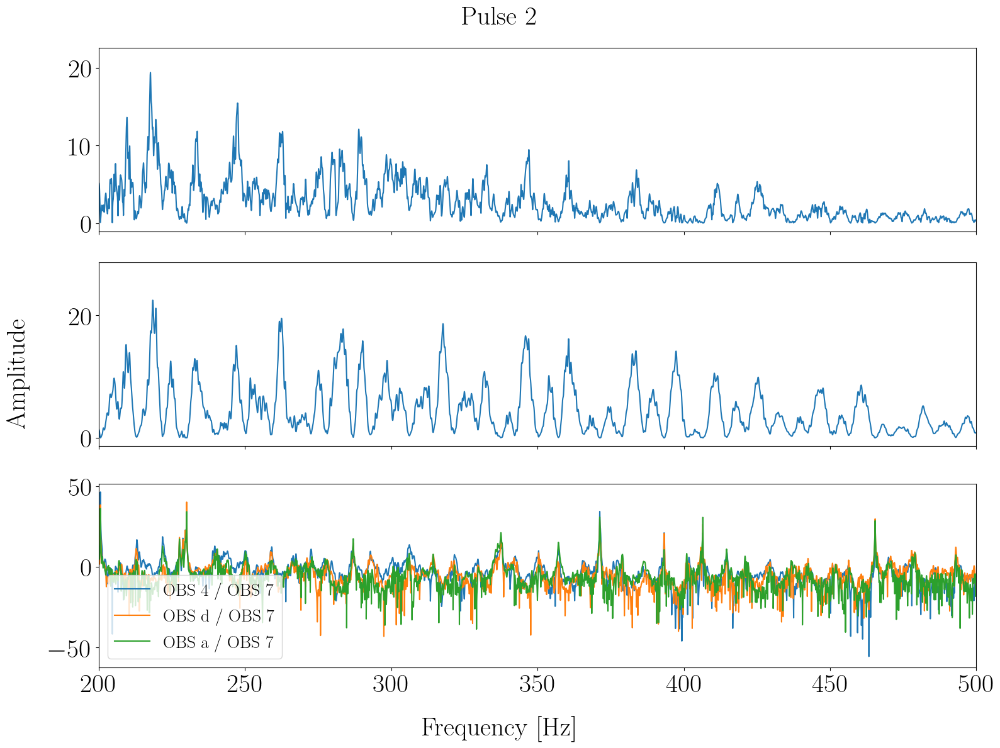

In [74]:
pi47 = []
pid7 = []
pia7 = []

pi_roll = []
npulse = arr_dt_obs4.size
for j in range(npulse):
    # OBS 4
    arr_obs4 = arr_dt_obs4[j]
    idx_start_obs4 = arr_dt_idx_obs4[j]
    # print(arr_obs4, idx_start_obs4)

    # OBS 7
    arr_obs7 = arr_dt_obs7[j]
    idx_start_obs7 = arr_dt_idx_obs7[j]
    # print(arr_obs7, idx_start_obs7)

    # OBS d
    arr_obsd = arr_dt_obsd[j]
    idx_start_obsd = arr_dt_idx_obsd[j]

    # OBS a
    arr_obsa = arr_dt_obsa[j]
    idx_start_obsa = arr_dt_idx_obsa[j]

    if arr_obs4 <= arr_obs7:
        pulse_start_dt = arr_obs4
        pulse_start_idx = idx_start_obs4
    else:
        pulse_start_dt = arr_obs7
        pulse_start_idx = idx_start_obs7

    # Extract pulse : option 1
    pulse_start_idx = pulse_start_idx - n_offset
    pulse_end_idx = pulse_start_idx + int(interval_inter_pulse_s * fs)
    pulse_obs4 = sig_obs4[pulse_start_idx:pulse_end_idx]
    pulse_obs7 = sig_obs7[pulse_start_idx:pulse_end_idx]
    pulse_obsd = sig_obsd[pulse_start_idx:pulse_end_idx]
    pulse_obsa = sig_obsa[pulse_start_idx:pulse_end_idx]

    pulse_start_idx_obs4, pulse_end_idx_obs4 = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obs7, pulse_end_idx_obs7 = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obsd, pulse_end_idx_obsd = pulse_start_idx, pulse_end_idx
    pulse_start_idx_obsa, pulse_end_idx_obsa = pulse_start_idx, pulse_end_idx

    # # Extract pulse
    # pulse_start_idx_obs4 = idx_start_obs4 - n_offset
    # pulse_end_idx_obs4 = pulse_start_idx_obs4 + int(interval_inter_pulse_s * fs)
    # pulse_obs4 = sig_obs4[pulse_start_idx_obs4:pulse_end_idx_obs4]

    # pulse_start_idx_obs7 = idx_start_obs7 - n_offset
    # pulse_end_idx_obs7 = pulse_start_idx_obs7 + int(interval_inter_pulse_s * fs)
    # pulse_obs7 = sig_obs7[pulse_start_idx_obs7:pulse_end_idx_obs7]

    # Compute cross spectrum S12 = X1 conj(X2)
    nfft = 2**16
    f_fft = np.fft.rfftfreq(nfft, d=1 / fs)
    
    fft_obs4 = np.fft.rfft(pulse_obs4, n=nfft)
    fft_obs7 = np.fft.rfft(pulse_obs7, n=nfft)
    fft_obsd = np.fft.rfft(pulse_obsd, n=nfft)
    fft_obsa = np.fft.rfft(pulse_obsa, n=nfft)

    sxy = fft_obs4 * np.conj(fft_obs7)
    syy = fft_obs7 * np.conj(fft_obs7)
    sdy = fft_obsd * np.conj(fft_obs7)
    say = fft_obsa * np.conj(fft_obs7)

    # OBS 4 / OBS 7
    pi_47 = sxy / syy
    pi47.append(pi_47)
    # OBS d / OBS 7
    pi_d7 = sdy / syy
    pid7.append(pi_d7)
    # OBS a / OBS 7
    pi_a7 = say / syy
    pia7.append(pi_a7)

    N = 5
    pi_roll_ = np.convolve(20 * np.log10(np.abs(pi_47)), np.ones(N) / N, mode="same")
    pi_roll.append(pi_roll_)

    if j < 3:
        fig, axs = plt.subplots(3, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        axs[0].plot(f_fft, np.abs(sxy))
        axs[1].plot(f_fft, np.abs(syy))
        axs[2].plot(f_fft, 20 * np.log10(np.abs(pi_47)), label="OBS 4 / OBS 7")
        axs[2].plot(f_fft, 20 * np.log10(np.abs(pi_d7)), label="OBS d / OBS 7")
        axs[2].plot(f_fft, 20 * np.log10(np.abs(pi_a7)), label="OBS a / OBS 7")

        # axs[2].plot(f_fft, pi_roll_)
        fig.suptitle(f"Pulse {j}")

        fig.supylabel("Amplitude")
        fig.supxlabel("Frequency [Hz]")

        plt.xlim(200,500)
        plt.legend()

In [75]:
pi47 = np.array(pi47)
pid7 = np.array(pid7)
pia7 = np.array(pia7)
pi_roll = np.array(pi_roll)
rep_id = np.arange(npulse)

In [76]:
pi2_47 = 20 * np.log10(np.abs(pi47))
pi2_d7 = 20 * np.log10(np.abs(pid7))
pi2_a7 = 20 * np.log10(np.abs(pia7))

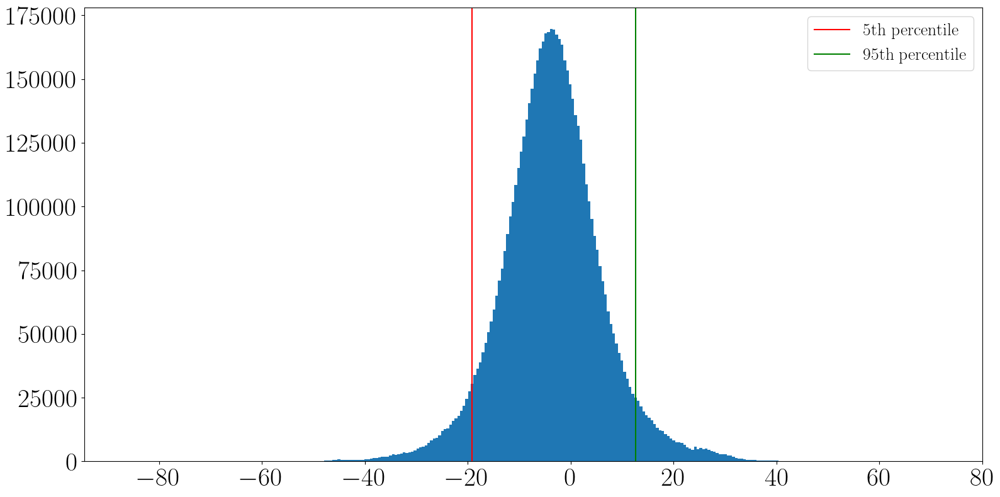

In [77]:
plt.hist(pi2_47.flatten(), bins=300)
plt.axvline(np.percentile(pi2_47.flatten(), 5), color="r", label="5th percentile")
plt.axvline(np.percentile(pi2_47.flatten(), 95), color="g", label="95th percentile")
plt.legend()


Text(0.5, 1.0, 'OBS a / OBS 7')

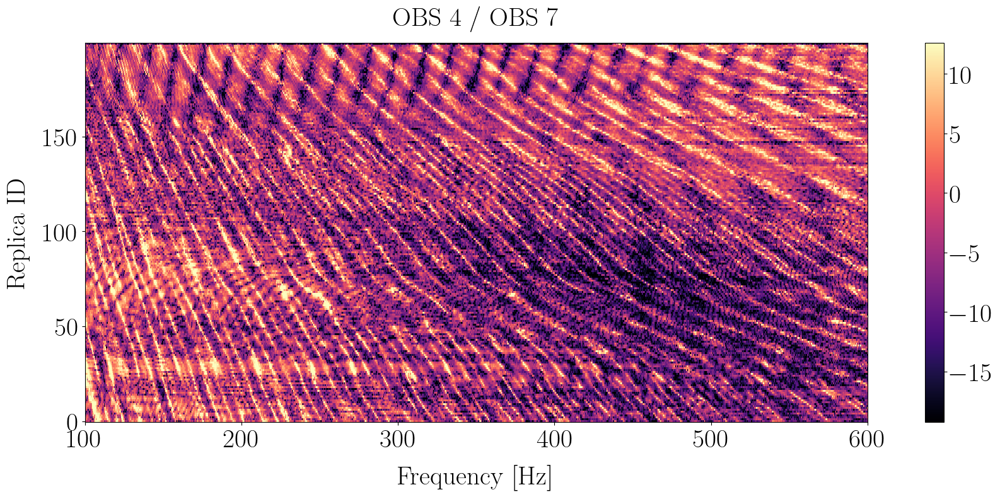

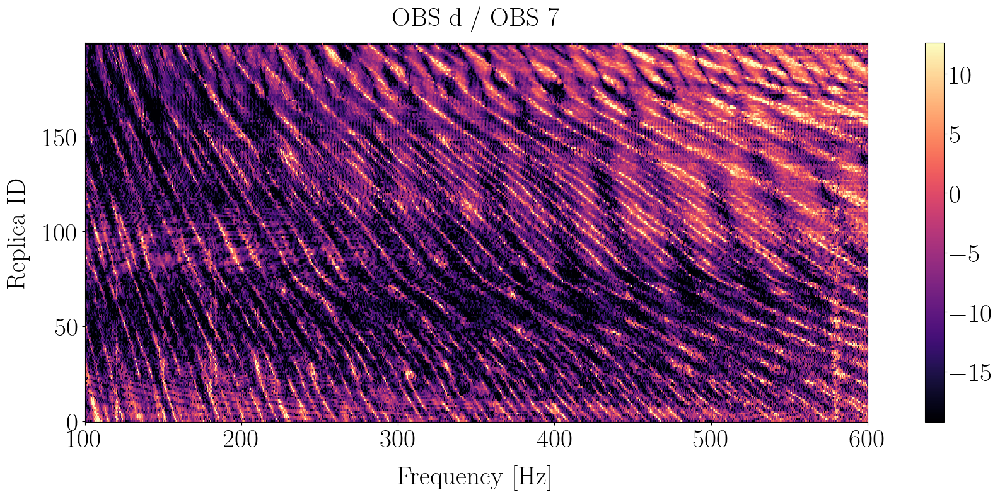

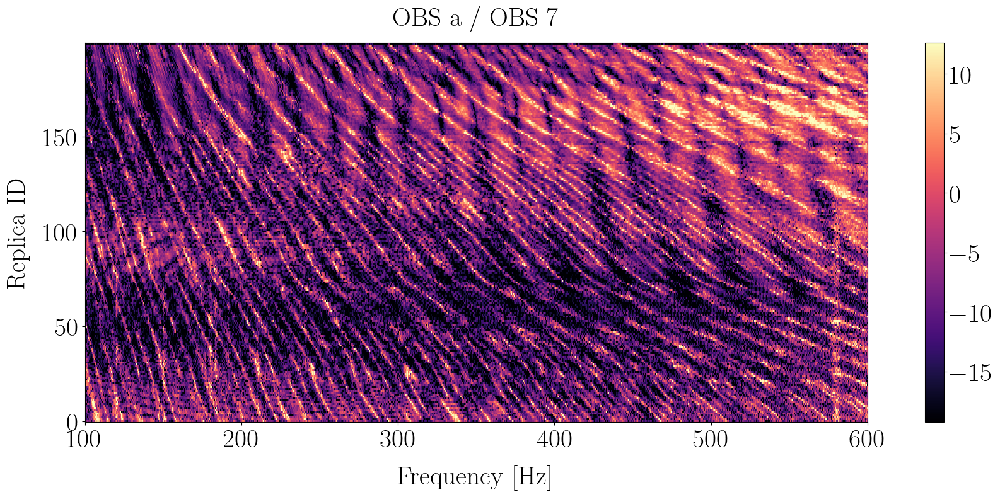

In [78]:
vmin = np.percentile(pi2_47, 5)
vmax = np.percentile(pi2_47, 95)

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    pi2_47,
    cmap="magma",
    vmin=vmin, 
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS 4 / OBS 7")

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    pi2_d7,
    cmap="magma",
    vmin=vmin,
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS d / OBS 7")

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    pi2_a7,
    cmap="magma",
    vmin=vmin,
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS a / OBS 7")

On peut observer un joli motif au passage du CPA d'un des OBS. Un point important, le motif évolue plutôt lentement contrairement à ce que l'on observe en petit fond à Groix.  

Le motif est similaire sur les capteurs 4, a, d. 

In [79]:
diff_pi2_47_a7 = pi2_47 - pi2_a7
diff_pi2_47_d7 = pi2_47 - pi2_d7
diff_pi2_d7_a7 = pi2_d7 - pi2_a7

Text(0.5, 1.0, 'OBS d / OBS 7 - OBS a / OBS 7')

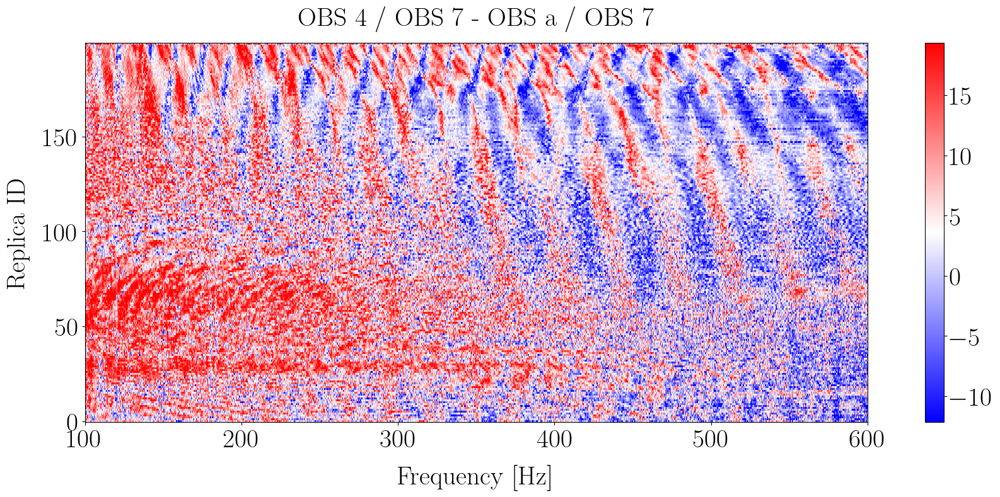

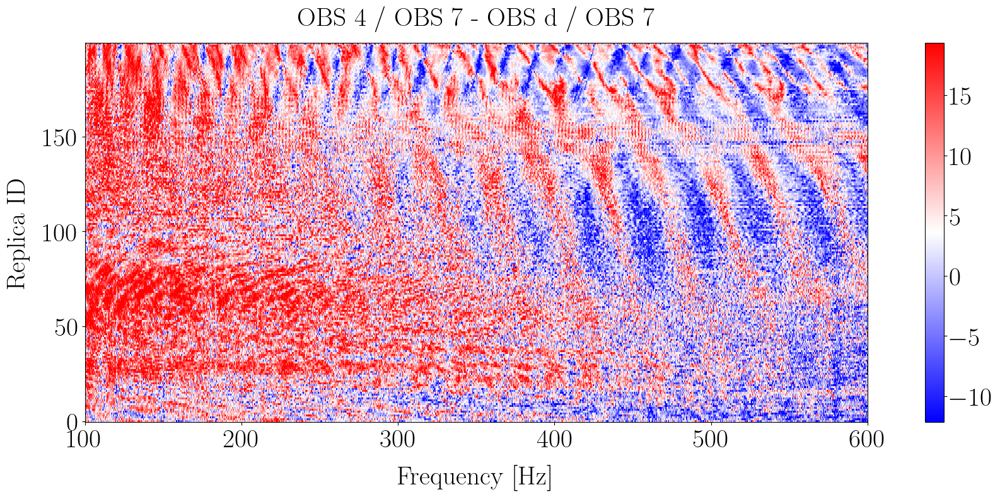

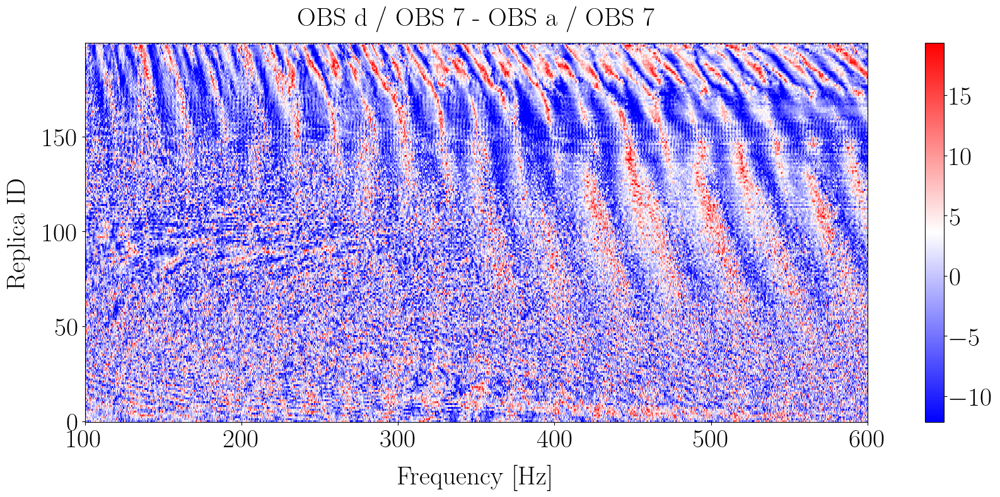

In [80]:
vmin = np.percentile(diff_pi2_47_a7, 5)
vmax = np.percentile(diff_pi2_47_a7, 95)

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    diff_pi2_47_a7,
    cmap="bwr",
    vmin=vmin,
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS 4 / OBS 7 - OBS a / OBS 7")

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    diff_pi2_47_d7,
    cmap="bwr",
    vmin=vmin,
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS 4 / OBS 7 - OBS d / OBS 7")

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    diff_pi2_d7_a7,
    cmap="bwr",
    vmin=vmin,
    vmax=vmax,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")
plt.title("OBS d / OBS 7 - OBS a / OBS 7")

Quelle que soit la position de la source considérée les capteurs encodent néanmoins bien une information différente. 

In [81]:
# pi2_roll = 20 * np.log10(np.abs(pi_roll))
# plt.figure()
# im = plt.pcolormesh(
#     f_fft,
#     rep_id,
#     pi2_roll,
#     cmap="magma",
#     vmin=-15,
#     vmax=50,
#     # vmin=np.percentile(pi2, 0.001),
#     # vmax=np.percentile(pi2, 0.99999),
# )
# plt.xlim(100, 600)
# plt.colorbar(im)

#### Option 2 : Fenêtre shiftée 

Une seconde approche consiste à considérer une fenêtre de durée T débutant à l'instant d'arrivée du signal de manière indépendante pour chacun des récepteurs. Ainsi, le signal ne contient que l'émission désirée. 

Mathématiquement, cela ne change rien. En effet, la réponse impulsionnelle du canal consiste en une durée $\tau$ de silence correspondant au temps de propagation du direct puis en une série de diracs correspond aux différentes arrivées. La réponse impulsionnelle est à support temporel fini et se termine donc par des 0 (si tenté que l'on regarde suffisamment loin, après le temps caractéristique de réverbération par exemple).    
Ainsi, pour des émissions successives suffisamment espacées dans le temps (temps inter pulse supérieur à la durée de la réponse impulsionnelle) le choix d'une telle fenêtre ne change rien d'un point de vue du module du rapport des fonctions de transfert. 

$$
\tilde{H_1}(f) = H_1(f) \times e^{+i2\pi f \tau}
$$

et 
$$
\tilde{\Pi}(f) = \frac{H_2(f)}{\tilde{H_1}(f)} = \frac{H_2(f)}{H_1(f)} \times e^{-i2\pi f \tau} 
$$

et

$$
\lvert \tilde{\Pi}(f) \rvert = \lvert \Pi(f) \rvert

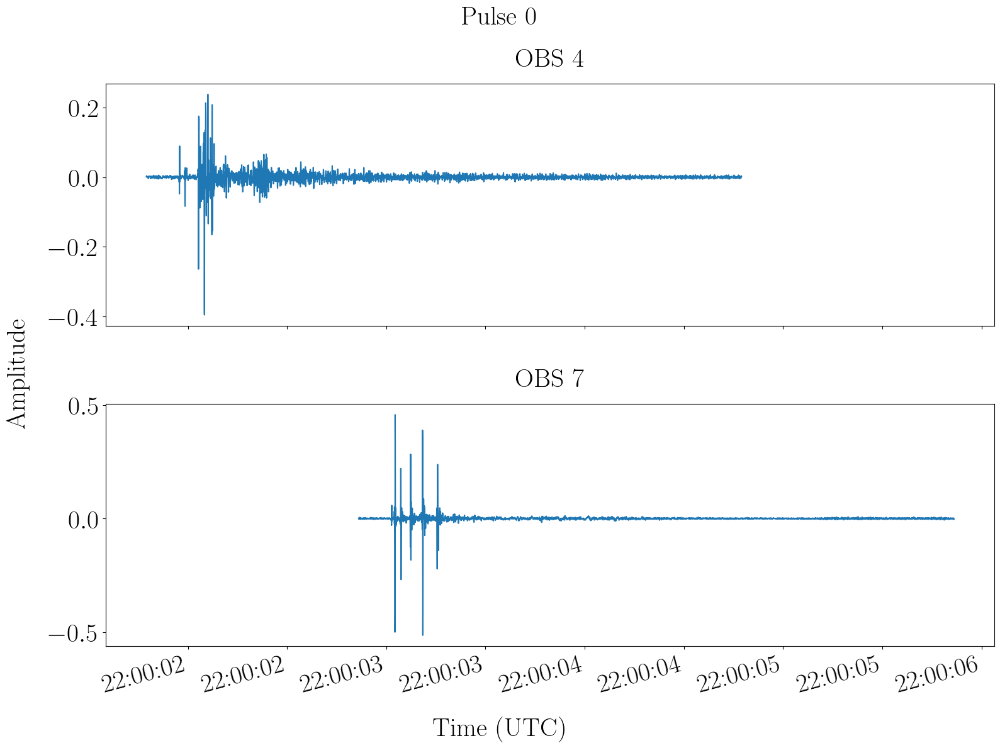

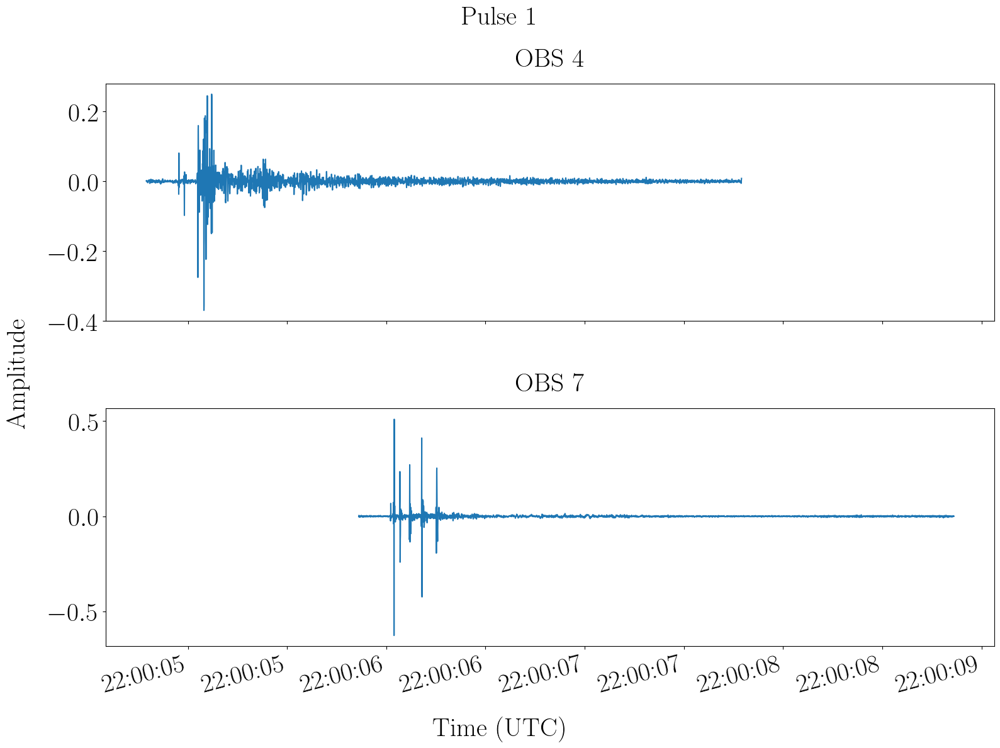

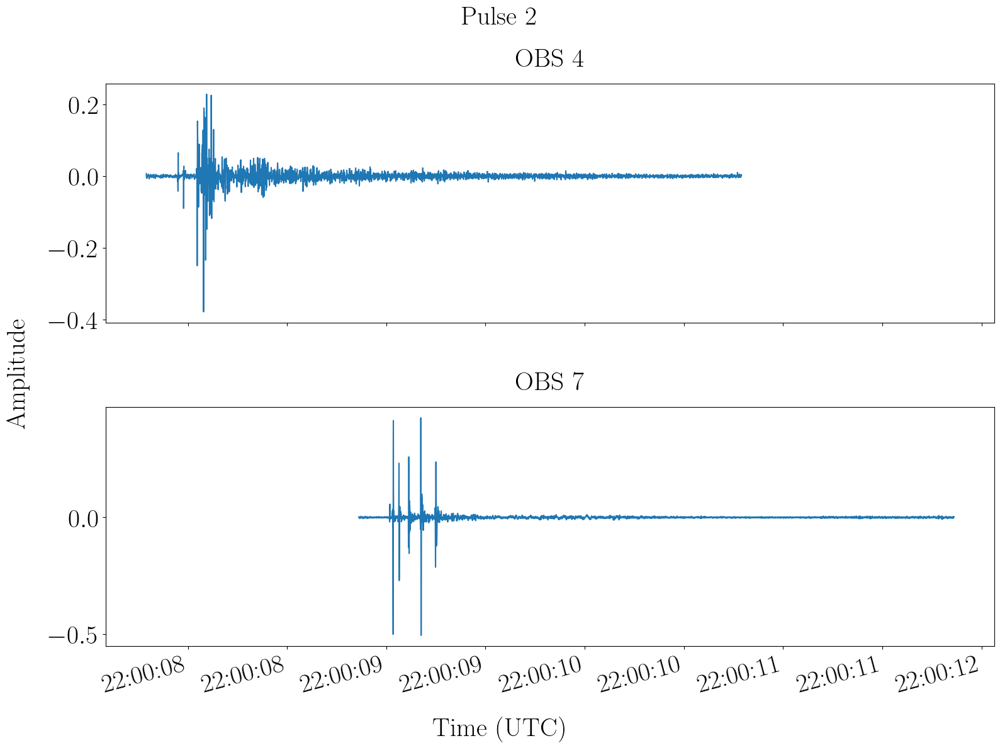

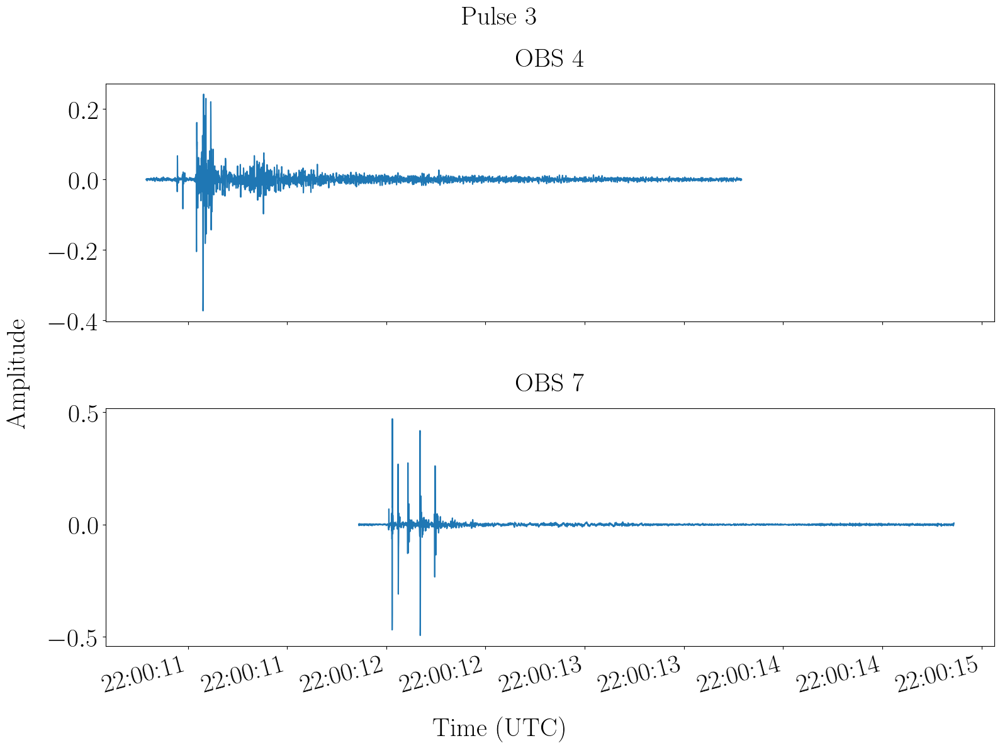

In [82]:
offset_s = 0.1
fs = 2000
n_offset = int(offset_s * fs)

arr_dt_obs4 = arrivals_dt[0]
arr_dt_idx_obs4 = arrivals_dt_idx[0]
arr_dt_obs7 = arrivals_dt[1]
arr_dt_idx_obs7 = arrivals_dt_idx[1]

sig_obs4 = signals[0]
obs4_dt = sig_dt[0]
sig_obs7 = signals[1]
obs7_dt = sig_dt[1]

# print(arr_dt_obs)
for j in range(arr_dt_obs4.size):
    # OBS 4
    arr_obs4 = arr_dt_obs4[j]
    idx_start_obs4 = arr_dt_idx_obs4[j]
    # print(arr_obs4, idx_start_obs4)

    # OBS 7
    arr_obs7 = arr_dt_obs7[j]
    idx_start_obs7 = arr_dt_idx_obs7[j]
    # print(arr_obs7, idx_start_obs7)

    if arr_obs4 <= arr_obs7:
        pulse_start_dt = arr_obs4
        pulse_start_idx = idx_start_obs4
    else:
        pulse_start_dt = arr_obs7
        pulse_start_idx = idx_start_obs7

    # # Extract pulse : option 1
    # pulse_start_idx = pulse_start_idx - n_offset
    # pulse_end_idx = pulse_start_idx + int(interval_inter_pulse_s * fs)
    # pulse_obs4 = sig_obs4[pulse_start_idx:pulse_end_idx]
    # pulse_obs7 = sig_obs7[pulse_start_idx:pulse_end_idx]

    # pulse_start_idx_obs4, pulse_end_idx_obs4 = pulse_start_idx, pulse_end_idx
    # pulse_start_idx_obs7, pulse_end_idx_obs7 = pulse_start_idx, pulse_end_idx

    # Extract pulse : option 2
    pulse_start_idx_obs4 = idx_start_obs4 - n_offset
    pulse_end_idx_obs4 = pulse_start_idx_obs4 + int(interval_inter_pulse_s * fs)
    pulse_obs4 = sig_obs4[pulse_start_idx_obs4:pulse_end_idx_obs4]

    pulse_start_idx_obs7 = idx_start_obs7 - n_offset
    pulse_end_idx_obs7 = pulse_start_idx_obs7 + int(interval_inter_pulse_s * fs)
    pulse_obs7 = sig_obs7[pulse_start_idx_obs7:pulse_end_idx_obs7]

    if j < 4:
        fig, axs = plt.subplots(2, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        axs[0].plot(obs4_dt[pulse_start_idx_obs4:pulse_end_idx_obs4], pulse_obs4)
        axs[0].set_title("OBS 4")
        axs[1].plot(obs7_dt[pulse_start_idx_obs7:pulse_end_idx_obs7], pulse_obs7)
        axs[1].set_title("OBS 7")

        fig.suptitle(f"Pulse {j}")

        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        formatter = mdates.DateFormatter("%H:%M:%S")
        axs[-1].xaxis.set_major_formatter(formatter)
        locator = mdates.AutoDateLocator(minticks=6, maxticks=10)
        axs[-1].xaxis.set_major_locator(locator)
        plt.setp(axs[-1].get_xticklabels(), rotation=15, ha="right")

        fig.supylabel("Amplitude")
        fig.supxlabel("Time (UTC)")

    # print(pulse_start_idx,pulse_end_idx)
    # print(obs4_dt[pulse_start_idx:pulse_end_idx])

    # pulse_obs4 =

Ici, le signal est d'abord reçu sur l'OBS 4 puis sur l'OBS 7 (ou inversement, cf remarque sur l'ambiguïté ci-dessus). Ainsi, la première partie du signal considéré pour l'OBS 7 correspond à l'émission précédente (et donc à la position de source précédente). 

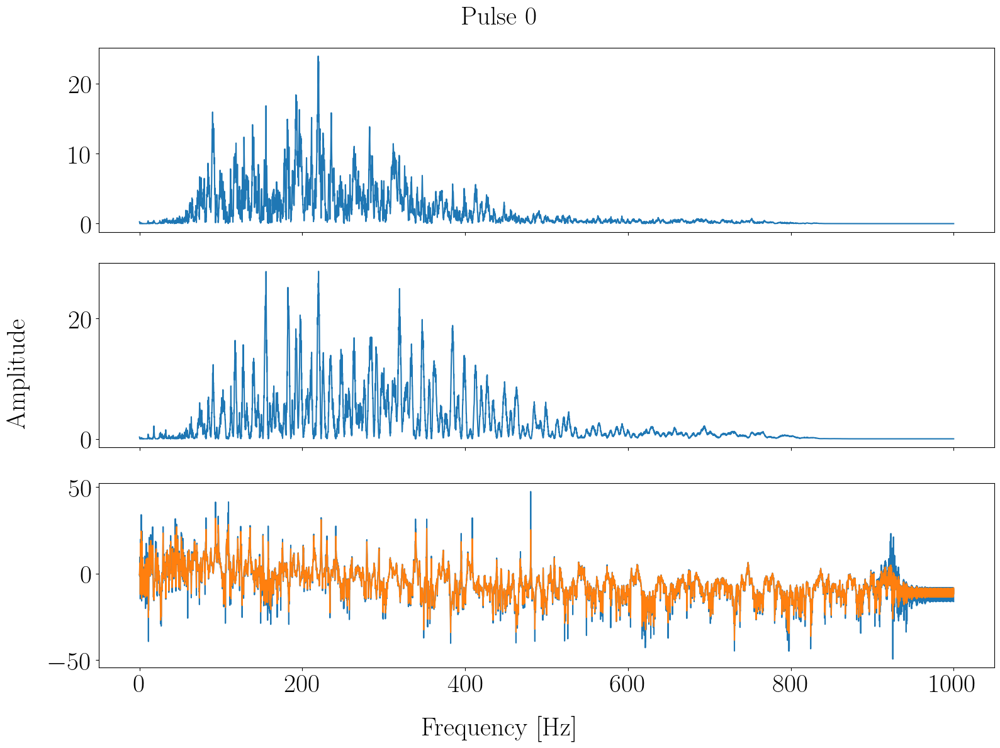

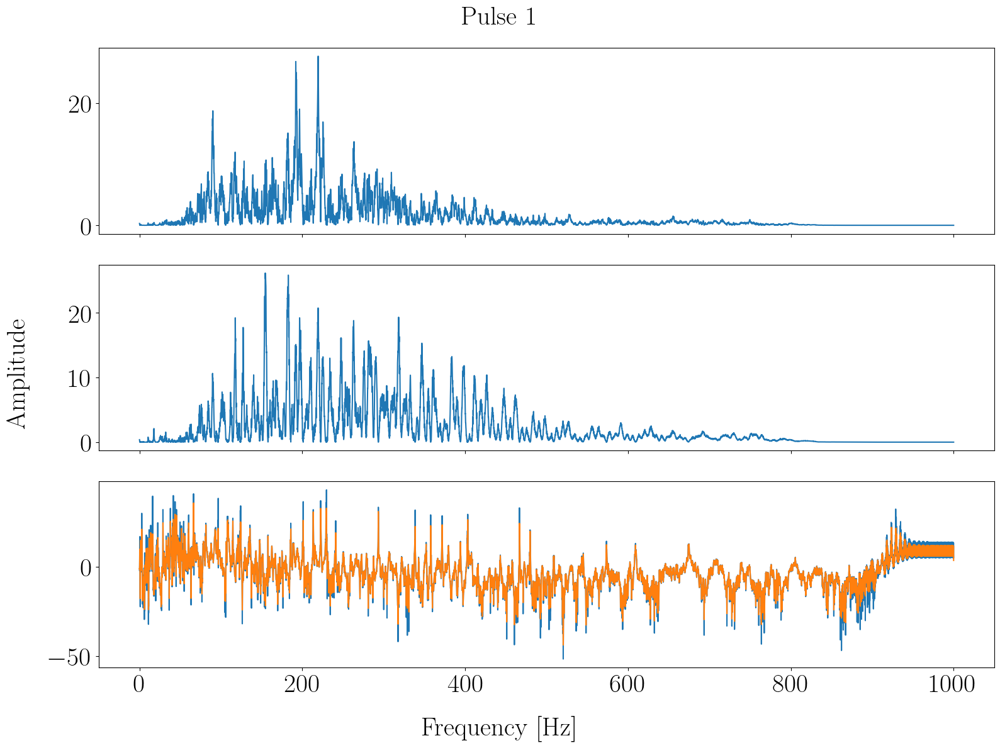

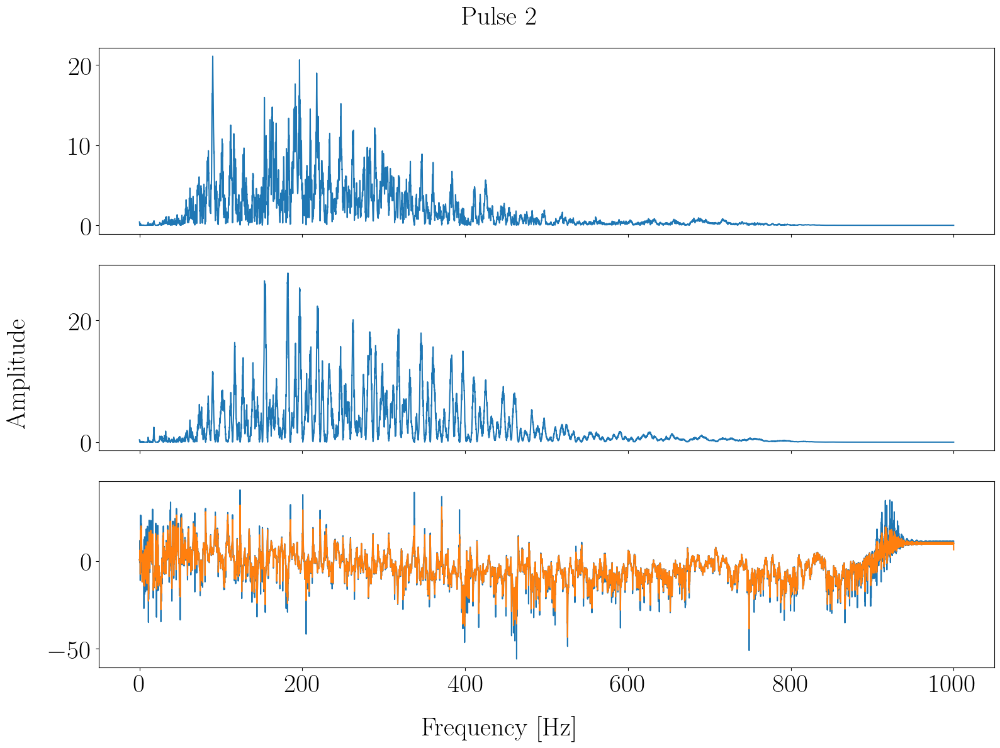

In [90]:
pi_tilde = []
pi_roll = []
npulse = arr_dt_obs4.size
for j in range(npulse):
    # OBS 4
    arr_obs4 = arr_dt_obs4[j]
    idx_start_obs4 = arr_dt_idx_obs4[j]
    # print(arr_obs4, idx_start_obs4)

    # OBS 7
    arr_obs7 = arr_dt_obs7[j]
    idx_start_obs7 = arr_dt_idx_obs7[j]
    # print(arr_obs7, idx_start_obs7)

    if arr_obs4 <= arr_obs7:
        pulse_start_dt = arr_obs4
        pulse_start_idx = idx_start_obs4
    else:
        pulse_start_dt = arr_obs7
        pulse_start_idx = idx_start_obs7

    # # Extract pulse : option 1
    # pulse_start_idx = pulse_start_idx - n_offset
    # pulse_end_idx = pulse_start_idx + int(interval_inter_pulse_s * fs)
    # pulse_obs4 = sig_obs4[pulse_start_idx:pulse_end_idx]
    # pulse_obs7 = sig_obs7[pulse_start_idx:pulse_end_idx]

    # Extract pulse : option 2
    pulse_start_idx_obs4 = idx_start_obs4 - n_offset
    pulse_end_idx_obs4 = pulse_start_idx_obs4 + int(interval_inter_pulse_s * fs)
    pulse_obs4 = sig_obs4[pulse_start_idx_obs4:pulse_end_idx_obs4]

    pulse_start_idx_obs7 = idx_start_obs7 - n_offset
    pulse_end_idx_obs7 = pulse_start_idx_obs7 + int(interval_inter_pulse_s * fs)
    pulse_obs7 = sig_obs7[pulse_start_idx_obs7:pulse_end_idx_obs7]

    # Compute cross spectrum S12 = X1 conj(X2)
    nfft = 2**16
    f_fft = np.fft.rfftfreq(nfft, d=1 / fs)
    fft_obs4 = np.fft.rfft(pulse_obs4, n=nfft)
    fft_obs7 = np.fft.rfft(pulse_obs7, n=nfft)
    sxy = fft_obs4 * np.conj(fft_obs7)
    syy = fft_obs7 * np.conj(fft_obs7)

    pi_xy = sxy / syy

    pi_tilde.append(pi_xy)

    N = 5
    pi_roll_ = np.convolve(20 * np.log10(np.abs(pi_xy)), np.ones(N) / N, mode="same")
    pi_roll.append(pi_roll_)

    if j < 3:
        fig, axs = plt.subplots(3, 1, sharex=True, figsize=(16, 12))
        axs = np.atleast_1d(axs)

        axs[0].plot(f_fft, np.abs(sxy))
        axs[1].plot(f_fft, np.abs(syy))
        axs[2].plot(f_fft, 20 * np.log10(np.abs(pi_xy)))
        axs[2].plot(f_fft, pi_roll_)
        fig.suptitle(f"Pulse {j}")

        fig.supylabel("Amplitude")
        fig.supxlabel("Frequency [Hz]")

        # plt.xlim(400,600)

In [91]:
pi_tilde = np.array(pi_tilde)
pi_roll_tilde = np.array(pi_roll)

Text(0, 0.5, 'Replica ID')

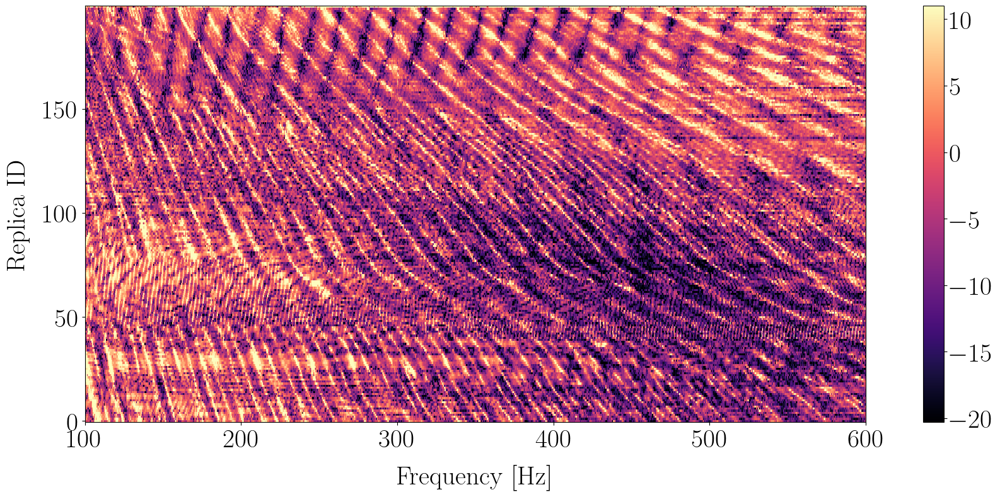

In [94]:
pi2_tilde = 20 * np.log10(np.abs(pi_tilde))

vmin = np.percentile(pi2_tilde, 5)
vmax = np.percentile(pi2_tilde, 95)

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    pi2_tilde,
    cmap="magma",
    vmin=vmin,
    vmax=vmax,
    # vmin=np.percentile(pi2, 0.001),
    # vmax=np.percentile(pi2, 0.99999),
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")

Text(0, 0.5, 'Replica ID')

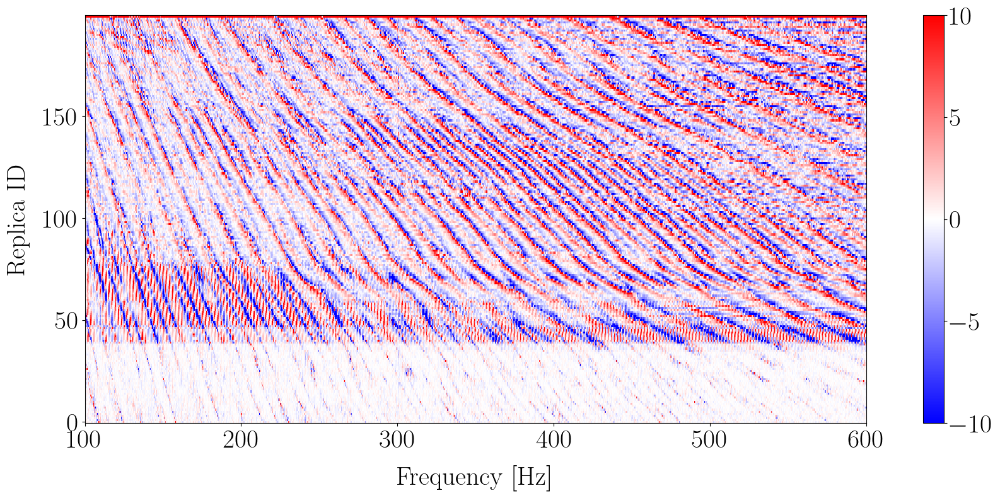

In [95]:
diff_pi = pi2_tilde - pi2_47
# diff_pi = 20 * np.log10(np.abs(pi_tilde) - np.abs(pi))

plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    diff_pi,
    cmap="bwr",
    vmin=-10,
    vmax=10,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")

Différence notable entre les deux méthodes de calcul. La différence traduit le motif général observé. 

# Left overs 

In [ ]:
N = 3
filt = np.ones(N) / N
pi_avg_rep = np.apply_along_axis(lambda m: np.convolve(m, filt, mode='same'), axis=0, arr=pi2)


In [ ]:
pi_avg_rep.shape

In [ ]:
plt.figure()
im = plt.pcolormesh(
    f_fft,
    rep_id,
    pi_avg_rep,
    cmap="magma",
    vmin=-30,
    vmax=25,
)
plt.xlim(100, 600)
# plt.ylim(50, 400)
plt.colorbar(im)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Replica ID")